# Example 2: `intrinsic` applied to MNIST on SimCLR with only rotation (0,360)

In this example, we apply `intrinsic` to data representations of MNIST images obtained with SimCLR.

SimCLR transformations include:



```
transforms.Compose([
            transforms.RandomRotation(degrees=(0, 360)),
            transforms.RandomApply([transforms.ColorJitter(brightness=0.5,
                                        contrast=0.5,
                                        saturation=0.5,
                                        hue=0.1)], p=0.8),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.1307], std=[0.3081])
        ])

```

SimCLR loss on train: 0.103



Embeddings are available at: [google drive link](https://drive.google.com/drive/folders/1-uy4mrYNx4eEZbCvwFivGwqbXnE3filc?usp=sharing)
\
SimCLR model weights are available at: [google drive link](https://drive.google.com/drive/folders/1r4XifQ8Dn8R4rHXDl73qvGBM8xAZJaES?usp=sharing)
\
We save embeddings on layers (see the full scheme below): `layer2_block2`, `layer3_block2`, `layer1_block2`, `layer4_block2`.

We calculate on each epoch for each saved layer:
*   Intrinsic dimension (by MLE, TwoNN)
*   Magnitude
*   Curvature
*   Persistence diagrams
*   Total persistence




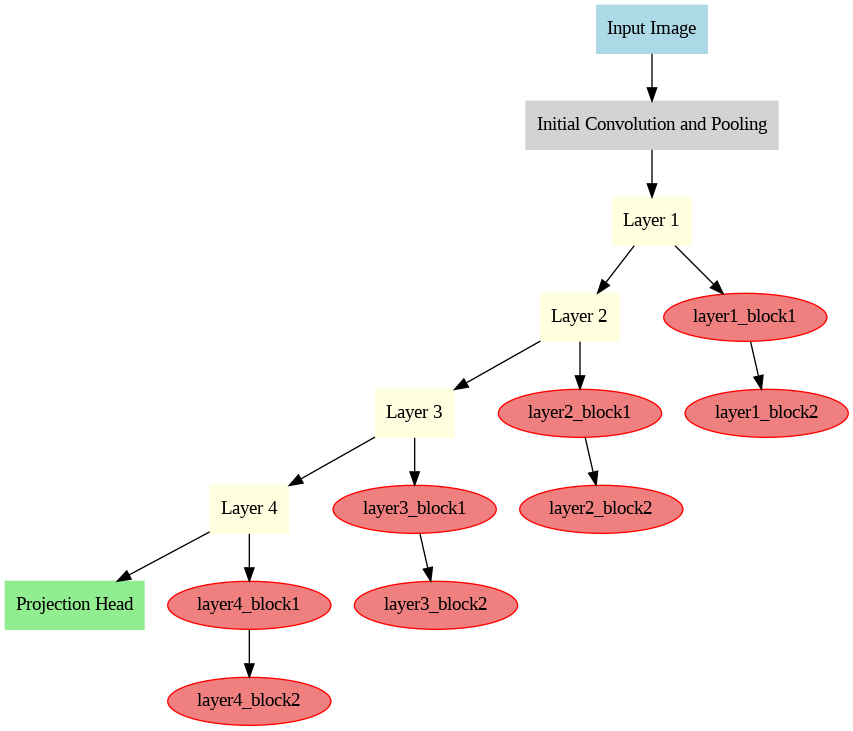

In [1]:
from IPython.display import Image
Image(filename='/content/simclr_full_diagram.png')

## Imports and installs

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from tqdm import tqdm
import numpy as np
import os
import matplotlib.pyplot as plt

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

Using device: cuda


In [ ]:
# Import Google Drive and mount it
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## SimCLR

In [ ]:
save_path = '/content/drive/My Drive/embeddings_SimCLR_MNIST_4_360'
os.makedirs(save_path, exist_ok=True)

In [ ]:
class SimCLR(nn.Module):
    def __init__(self, base_model, projection_dim=128):
        super(SimCLR, self).__init__()
        self.base_model = base_model
        self.feature_dim = self.base_model.fc.in_features
        self.base_model.fc = nn.Identity()
        self.projection_head = nn.Sequential(
            nn.Linear(self.feature_dim, self.feature_dim),
            nn.ReLU(),
            nn.Linear(self.feature_dim, projection_dim)
        )
        self._init_hooks()
        self._init_weights()

    def _init_hooks(self):
        self.layer_outputs = {}
        def get_activation(name):
            def hook(model, input, output):
                self.layer_outputs[name] = output
            return hook

        # Register hooks for desired layers
        self.base_model.layer1[1].register_forward_hook(get_activation('layer1_block2'))
        self.base_model.layer2[1].register_forward_hook(get_activation('layer2_block2'))
        self.base_model.layer3[1].register_forward_hook(get_activation('layer3_block2'))
        self.base_model.layer4[1].register_forward_hook(get_activation('layer4_block2'))
        self.base_model.avgpool.register_forward_hook(get_activation('avgpool'))

    def _init_weights(self):
        for m in self.projection_head.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        self.layer_outputs = {}  # Reset stored outputs
        features = self.base_model(x)
        projections = self.projection_head(features)
        return projections, features

class SimCLRTransform:
    def __init__(self, size):
        self.train_transform = transforms.Compose([
            # transforms.RandomResizedCrop(size=size, scale=(0.2, 1.0)),
            # transforms.RandomHorizontalFlip(),
            # transforms.RandomVerticalFlip(),
            transforms.RandomRotation(degrees=(0, 360)),
            # transforms.RandomApply([transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), shear=10)], p=0.8),
            transforms.RandomApply([transforms.ColorJitter(brightness=0.5,
                                        contrast=0.5,
                                        saturation=0.5,
                                        hue=0.1)], p=0.8),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.1307], std=[0.3081])  # Mean and std for MNIST
        ])

    def __call__(self, x):
        return self.train_transform(x), self.train_transform(x)

def get_dataset(dataset_name, batch_size):
    if dataset_name == "MNIST":
        transform = SimCLRTransform(size=28)
        train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
    elif dataset_name == "EMNIST":
        transform = SimCLRTransform(size=28, scale=(0.2, 1.0))
        train_dataset = datasets.EMNIST(root='./data', split='balanced', train=True, transform=transform, download=True)
    elif dataset_name == "COIL100":
        transform = SimCLRTransform(size=128)
        train_dataset = datasets.ImageFolder(root='./coil-100', transform=transform)
    else:
        raise ValueError("Unsupported dataset: {}".format(dataset_name))

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    return train_loader

class NTXentLoss(nn.Module):
    def __init__(self, batch_size, temperature):
        super(NTXentLoss, self).__init__()
        self.batch_size = batch_size
        self.temperature = temperature
        self.criterion = nn.CrossEntropyLoss(reduction="sum")


    def forward(self, z_i, z_j):
        # Concatenate the two sets of embeddings
        z = torch.cat((z_i, z_j), dim=0)

        # Compute the similarity matrix
        sim = torch.matmul(z, z.T) / self.temperature

        # Create a mask to remove the diagonal elements (self-similarity)
        N = 2 * self.batch_size
        mask = torch.eye(N, device=sim.device).bool()
        sim = sim.masked_select(~mask).view(N, N-1)

        # Create the labels for the positive pairs
        labels = torch.cat([torch.arange(self.batch_size) for _ in range(2)], dim=0)
        labels = (labels.unsqueeze(1) == labels.unsqueeze(0)).float().to(sim.device)
        labels = labels.masked_select(~mask).view(N, N-1)

        # Compute the loss
        loss = self.criterion(sim, labels)
        loss /= N

        return loss

def train_simclr(model, data_loader, optimizer, criterion, device, epochs, save_path):
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    model.train()
    for epoch in range(epochs):
        total_loss = 0.0
        epoch_embeddings = {f'layer{i}_block{j}': [] for i in range(1, 5) for j in range(2, 3)}
        epoch_embeddings['final'] = []
        progress_bar = tqdm(data_loader, desc=f"Epoch {epoch+1}/{epochs}")

        for (x_i, x_j), target in progress_bar:
            x_i = x_i.to(device)
            x_j = x_j.to(device)
            target = target.to(device)

            optimizer.zero_grad()
            z_i, features_i = model(x_i)
            z_j, features_j = model(x_j)

            loss = criterion(z_i, z_j)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)

            optimizer.step()

            total_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())

            for i in range(1, 5):
                for j in range(2, 3):
                    layer_name = f'layer{i}_block{j}'
                    if layer_name in model.layer_outputs:
                        epoch_embeddings[layer_name].append(model.layer_outputs[layer_name].cpu().detach().numpy())

            if 'avgpool' in model.layer_outputs:
                epoch_embeddings['final'].append(model.layer_outputs['avgpool'].cpu().detach().numpy())

        if epoch % 5 == 0:
          for i in range(1, 5):
              for j in range(2, 3):
                  layer_name = f'layer{i}_block{j}'
                  if epoch_embeddings[layer_name]:
                      np.save(os.path.join(save_path, f'epoch_{epoch+1}_{layer_name}_embeddings.npy'), np.concatenate(epoch_embeddings[layer_name], axis=0))

          if epoch_embeddings['final']:
              np.save(os.path.join(save_path, f'epoch_{epoch+1}_final_embeddings.npy'), np.concatenate(epoch_embeddings['final'], axis=0))

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(data_loader)}')


In [ ]:
num_epochs = 51
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Modify ResNet to accept grayscale input (1 ch instead of 3)
base_model = models.resnet18(weights=None)
base_model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
simclr_model = SimCLR(base_model=base_model).to(device)

optimizer = optim.Adam(simclr_model.parameters(), lr=3e-4)
criterion = NTXentLoss(batch_size=250, temperature=0.5)

train_loader = get_dataset("MNIST", batch_size=250)
train_simclr(simclr_model, train_loader, optimizer, criterion, device, epochs=num_epochs, save_path=save_path)


Epoch 1/51: 100%|██████████| 240/240 [00:19<00:00, 12.60it/s, loss=1.09]


Epoch [1/51], Loss: 6.105843285719554


Epoch 2/51: 100%|██████████| 240/240 [00:19<00:00, 12.07it/s, loss=0.61]


Epoch [2/51], Loss: 0.8665294535458088


Epoch 3/51: 100%|██████████| 240/240 [00:20<00:00, 11.84it/s, loss=0.522]


Epoch [3/51], Loss: 0.6271367484082778


Epoch 4/51: 100%|██████████| 240/240 [00:19<00:00, 12.14it/s, loss=0.387]


Epoch [4/51], Loss: 0.5279779117554426


Epoch 5/51: 100%|██████████| 240/240 [00:19<00:00, 12.25it/s, loss=0.367]


Epoch [5/51], Loss: 0.46613496815164884


Epoch 6/51: 100%|██████████| 240/240 [00:19<00:00, 12.39it/s, loss=0.417]


Epoch [6/51], Loss: 0.4223835711677869


Epoch 7/51: 100%|██████████| 240/240 [00:19<00:00, 12.44it/s, loss=0.227]


Epoch [7/51], Loss: 0.3953166558717688


Epoch 8/51: 100%|██████████| 240/240 [00:19<00:00, 12.21it/s, loss=0.307]


Epoch [8/51], Loss: 0.36345671067635216


Epoch 9/51: 100%|██████████| 240/240 [00:19<00:00, 12.25it/s, loss=0.246]


Epoch [9/51], Loss: 0.35492202124247946


Epoch 10/51: 100%|██████████| 240/240 [00:19<00:00, 12.38it/s, loss=0.381]


Epoch [10/51], Loss: 0.33794407738993565


Epoch 11/51: 100%|██████████| 240/240 [00:19<00:00, 12.57it/s, loss=0.346]


Epoch [11/51], Loss: 0.3237945856526494


Epoch 12/51: 100%|██████████| 240/240 [00:20<00:00, 11.53it/s, loss=0.267]


Epoch [12/51], Loss: 0.3111080698048075


Epoch 13/51: 100%|██████████| 240/240 [00:19<00:00, 12.50it/s, loss=0.256]


Epoch [13/51], Loss: 0.29648318433513243


Epoch 14/51: 100%|██████████| 240/240 [00:18<00:00, 12.73it/s, loss=0.293]


Epoch [14/51], Loss: 0.2902048183605075


Epoch 15/51: 100%|██████████| 240/240 [00:19<00:00, 12.42it/s, loss=0.312]


Epoch [15/51], Loss: 0.27825089283287524


Epoch 16/51: 100%|██████████| 240/240 [00:18<00:00, 12.72it/s, loss=0.327]


Epoch [16/51], Loss: 0.2826127834618092


Epoch 17/51: 100%|██████████| 240/240 [00:20<00:00, 11.45it/s, loss=0.196]


Epoch [17/51], Loss: 0.2683539337168137


Epoch 18/51: 100%|██████████| 240/240 [00:19<00:00, 12.23it/s, loss=0.251]


Epoch [18/51], Loss: 0.25918946651120983


Epoch 19/51: 100%|██████████| 240/240 [00:19<00:00, 12.63it/s, loss=0.329]


Epoch [19/51], Loss: 0.24926711097359658


Epoch 20/51: 100%|██████████| 240/240 [00:19<00:00, 12.58it/s, loss=0.207]


Epoch [20/51], Loss: 0.2438267558813095


Epoch 21/51: 100%|██████████| 240/240 [00:19<00:00, 12.37it/s, loss=0.276]


Epoch [21/51], Loss: 0.24388165989269814


Epoch 22/51: 100%|██████████| 240/240 [00:20<00:00, 11.49it/s, loss=0.135]


Epoch [22/51], Loss: 0.23740057734151682


Epoch 23/51: 100%|██████████| 240/240 [00:19<00:00, 12.33it/s, loss=0.197]


Epoch [23/51], Loss: 0.22962693441659213


Epoch 24/51: 100%|██████████| 240/240 [00:19<00:00, 12.61it/s, loss=0.271]


Epoch [24/51], Loss: 0.23041534023359417


Epoch 25/51: 100%|██████████| 240/240 [00:19<00:00, 12.50it/s, loss=0.304]


Epoch [25/51], Loss: 0.22416451936587692


Epoch 26/51: 100%|██████████| 240/240 [00:18<00:00, 12.66it/s, loss=0.198]


Epoch [26/51], Loss: 0.2292641059185068


Epoch 27/51: 100%|██████████| 240/240 [00:20<00:00, 11.61it/s, loss=0.218]


Epoch [27/51], Loss: 0.21399699825172622


Epoch 28/51: 100%|██████████| 240/240 [00:19<00:00, 12.39it/s, loss=0.187]


Epoch [28/51], Loss: 0.21620317827910185


Epoch 29/51: 100%|██████████| 240/240 [00:18<00:00, 12.68it/s, loss=0.183]


Epoch [29/51], Loss: 0.21290914257988333


Epoch 30/51: 100%|██████████| 240/240 [00:19<00:00, 12.15it/s, loss=0.211]


Epoch [30/51], Loss: 0.20657541416585445


Epoch 31/51: 100%|██████████| 240/240 [00:18<00:00, 12.64it/s, loss=0.184]


Epoch [31/51], Loss: 0.20291009107604624


Epoch 32/51: 100%|██████████| 240/240 [00:22<00:00, 10.53it/s, loss=0.166]


Epoch [32/51], Loss: 0.169808740215376


Epoch 33/51: 100%|██████████| 240/240 [00:19<00:00, 12.48it/s, loss=0.0936]


Epoch [33/51], Loss: 0.14978278752726812


Epoch 34/51: 100%|██████████| 240/240 [00:19<00:00, 12.36it/s, loss=0.075]


Epoch [34/51], Loss: 0.1432699689020713


Epoch 35/51: 100%|██████████| 240/240 [00:19<00:00, 12.59it/s, loss=0.087]


Epoch [35/51], Loss: 0.13458784051860373


Epoch 36/51: 100%|██████████| 240/240 [00:19<00:00, 12.40it/s, loss=0.13]


Epoch [36/51], Loss: 0.132925930681328


Epoch 37/51: 100%|██████████| 240/240 [00:22<00:00, 10.89it/s, loss=0.177]


Epoch [37/51], Loss: 0.1292219039518386


Epoch 38/51: 100%|██████████| 240/240 [00:19<00:00, 12.48it/s, loss=0.115]


Epoch [38/51], Loss: 0.13191591718544562


Epoch 39/51: 100%|██████████| 240/240 [00:19<00:00, 12.47it/s, loss=0.148]


Epoch [39/51], Loss: 0.1263139057594041


Epoch 40/51: 100%|██████████| 240/240 [00:19<00:00, 12.55it/s, loss=0.156]


Epoch [40/51], Loss: 0.1250410270721962


Epoch 41/51: 100%|██████████| 240/240 [00:19<00:00, 12.45it/s, loss=0.0897]


Epoch [41/51], Loss: 0.12181985379817585


Epoch 42/51: 100%|██████████| 240/240 [00:22<00:00, 10.64it/s, loss=0.0904]


Epoch [42/51], Loss: 0.1182061967983221


Epoch 43/51: 100%|██████████| 240/240 [00:19<00:00, 12.10it/s, loss=0.0945]


Epoch [43/51], Loss: 0.11437566272603969


Epoch 44/51: 100%|██████████| 240/240 [00:19<00:00, 12.60it/s, loss=0.174]


Epoch [44/51], Loss: 0.114180478391548


Epoch 45/51: 100%|██████████| 240/240 [00:19<00:00, 12.54it/s, loss=0.0866]


Epoch [45/51], Loss: 0.11273435779536764


Epoch 46/51: 100%|██████████| 240/240 [00:19<00:00, 12.54it/s, loss=0.17]


Epoch [46/51], Loss: 0.11625232443523904


Epoch 47/51: 100%|██████████| 240/240 [00:20<00:00, 11.55it/s, loss=0.118]


Epoch [47/51], Loss: 0.11032651936014494


Epoch 48/51: 100%|██████████| 240/240 [00:20<00:00, 11.84it/s, loss=0.0969]


Epoch [48/51], Loss: 0.11335782427340746


Epoch 49/51: 100%|██████████| 240/240 [00:19<00:00, 12.62it/s, loss=0.0759]


Epoch [49/51], Loss: 0.1099019832443446


Epoch 50/51: 100%|██████████| 240/240 [00:19<00:00, 12.39it/s, loss=0.0579]


Epoch [50/51], Loss: 0.10211203920965393


Epoch 51/51: 100%|██████████| 240/240 [00:19<00:00, 12.45it/s, loss=0.0993]


Epoch [51/51], Loss: 0.10374833292638262


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:01<00:00, 5104240.28it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 134816.76it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:05<00:00, 317982.47it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 4512204.82it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



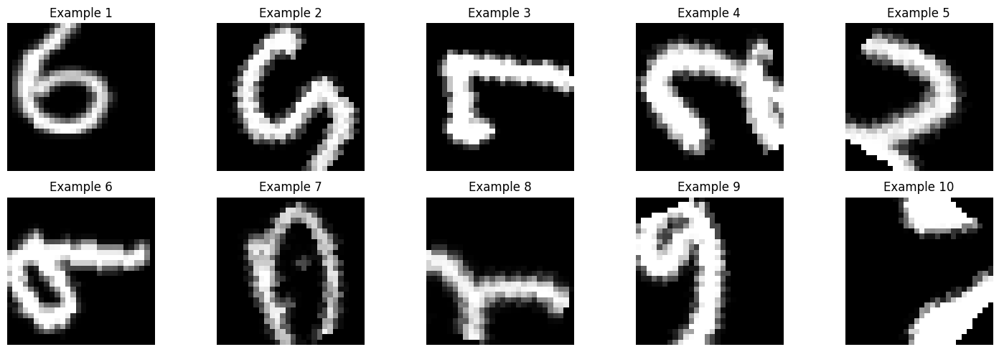

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision import datasets
import matplotlib.pyplot as plt

# Define SimCLRTransform
class SimCLRTransform:
    def __init__(self, size):
        self.train_transform = transforms.Compose([
            transforms.RandomResizedCrop(size=size, scale=(0.2, 1.0)),
            transforms.RandomRotation(degrees=(0, 360)),
            transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.1307], std=[0.3081])  # Mean and std for MNIST
        ])

    def __call__(self, x):
        x1 = self.train_transform(x)
        x2 = self.train_transform(x)
        return x1, x2  # Return the transformed images as tensors

# Load MNIST dataset with SimCLRTransform
transform = SimCLRTransform(size=28)
mnist_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)

# Select 10 random examples
indices = torch.randperm(len(mnist_dataset))[:10]

# Plot the transformed images
plt.figure(figsize=(15, 5))
for i, idx in enumerate(indices):
    image1, image2 = mnist_dataset[idx]

    # Convert tensors to numpy arrays and remove batch dimension if present
    image1 = image1[0].numpy().squeeze()
    # image2 = image2[0].numpy().squeeze()

    plt.subplot(2, 5, i + 1)
    plt.imshow(image1, cmap='gray')
    plt.title(f'Example {i+1}')
    plt.axis('off')

    # plt.subplot(2, 5, i + 6)
    # plt.imshow(image2, cmap='gray')
    # plt.title(f'Example {i+1} - Image 2')
    # plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
def save_simclr_model(model, optimizer, save_path):
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, save_path)

In [ ]:
save_path = '/content/simclr_mnist.pth'
save_simclr_model(simclr_model, optimizer, save_path)

In [ ]:
def load_simclr_model(model, optimizer, load_path):
    checkpoint = torch.load(load_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    model.to(device)

    return model, optimizer

In [ ]:
load_path =  '/content/simclr_mnist.pth'
base_model=models.resnet18(weights=None)
base_model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
model = SimCLR(base_model=base_model)
optimizer = optim.Adam(model.parameters(), lr=3e-4)
loaded_model, loaded_optimizer = load_simclr_model(model, optimizer, load_path)

In [ ]:
save_path = '/content/drive/My Drive/embeddings_SimCLR_MNIST_4_360'
os.makedirs(save_path, exist_ok=True)

In [ ]:
def load_embeddings_from_drive(folder_path, epochs):
    embeddings = {}

    for epoch in range(1, epochs + 1, 5):
        epoch_embeddings = {}

        for i in range(1, 5):
            for j in range(2, 3):
                layer_name = f'layer{i}_block{j}'
                file_path = os.path.join(folder_path, f'epoch_{epoch}_{layer_name}_embeddings.npy')
                if os.path.exists(folder_path):
                    epoch_embeddings[layer_name] = np.load(file_path)

        final_file_path = os.path.join(folder_path, f'epoch_{epoch}_final_embeddings.npy')
        if os.path.exists(folder_path):
            epoch_embeddings['final'] = np.load(final_file_path)

        labels_file_path = os.path.join(folder_path, f'epoch_{epoch}_labels.npy')
        if os.path.exists(labels_file_path):
            epoch_embeddings['labels'] = np.load(labels_file_path)

        if epoch_embeddings:
            embeddings[epoch] = epoch_embeddings

    return embeddings

In [ ]:
embeddings = load_embeddings_from_drive(save_path, epochs=51)

for epoch, embs in embeddings.items():
  for layer, emb in embs.items():
    print(f"Epoch: {epoch}, Layer: {layer}, Embedding shape: {emb.shape}")

Epoch: 1, Layer: layer1_block2, Embedding shape: (60000, 64, 7, 7)
Epoch: 1, Layer: layer2_block2, Embedding shape: (60000, 128, 4, 4)
Epoch: 1, Layer: layer3_block2, Embedding shape: (60000, 256, 2, 2)
Epoch: 1, Layer: layer4_block2, Embedding shape: (60000, 512, 1, 1)
Epoch: 1, Layer: final, Embedding shape: (60000, 512, 1, 1)
Epoch: 6, Layer: layer1_block2, Embedding shape: (60000, 64, 7, 7)
Epoch: 6, Layer: layer2_block2, Embedding shape: (60000, 128, 4, 4)
Epoch: 6, Layer: layer3_block2, Embedding shape: (60000, 256, 2, 2)
Epoch: 6, Layer: layer4_block2, Embedding shape: (60000, 512, 1, 1)
Epoch: 6, Layer: final, Embedding shape: (60000, 512, 1, 1)
Epoch: 11, Layer: layer1_block2, Embedding shape: (60000, 64, 7, 7)
Epoch: 11, Layer: layer2_block2, Embedding shape: (60000, 128, 4, 4)
Epoch: 11, Layer: layer3_block2, Embedding shape: (60000, 256, 2, 2)
Epoch: 11, Layer: layer4_block2, Embedding shape: (60000, 512, 1, 1)
Epoch: 11, Layer: final, Embedding shape: (60000, 512, 1, 1)
Ep

In [ ]:
list_embs = []
list_epochs = []
list_layers = []
list_labels = []

for epoch, embs in embeddings.items():
    for layer, emb in embs.items():
        if layer != 'labels' and layer != 'final':  # Skip 'labels' and 'final' keys
            list_embs.append(emb.reshape(emb.shape[0], -1))
            list_epochs.append(epoch)
            list_layers.append(layer)
        else:
          list_labels.append(emb)

total_embeddings = len(list_embs)
print("Total embeddings:", total_embeddings)

Total embeddings: 44


In [ ]:
layers_simclr = list(set(list_layers))
layers_simclr.sort()
layers_simclr

['layer1_block2', 'layer2_block2', 'layer3_block2', 'layer4_block2']

In [ ]:
# Define the ResNet-18 layer structure
layer_structure = {
    'conv1': 1,
    'layer1': 2,
    'layer2': 2,
    'layer3': 2,
    'layer4': 2,
    'avgpool': 1
}

# Calculate total number of layers
total_layers = sum(layer_structure.values())

# Define a function to calculate relative depth and normalize
def calculate_and_normalize_depth(layer_name):
    if 'layer' in layer_name:
        layer_num = int(layer_name[5])  # Extract the layer number (e.g., 'layer1' -> 1)
        block_num = int(layer_name[-1])  # Extract the block number (e.g., 'block2' -> 2)
        # Calculate depth relative to the entire network
        relative_depth = sum(list(layer_structure.values())[:layer_num]) + block_num
    else:
        # For non-layer specific parts like 'avgpool', 'fc', etc.
        relative_depth = sum(list(layer_structure.values())[:-1]) + 1

    # Normalize relative depth to range [0, 1]
    normalized_depth = (relative_depth - 1) / (total_layers - 1)

    return normalized_depth


# Calculate and normalize depths
normalized_depths = [calculate_and_normalize_depth(layer) for layer in layers_simclr]

# Print normalized depths
for layer, norm_depth in zip(layers_simclr, normalized_depths):
    print(f'{layer} normalized depth:', norm_depth)


layer1_block2 normalized depth: 0.2222222222222222
layer2_block2 normalized depth: 0.4444444444444444
layer3_block2 normalized depth: 0.6666666666666666
layer4_block2 normalized depth: 0.8888888888888888


In [ ]:
normalized_depths.sort()

## Predict angle of rotation

In [ ]:
class RotationRegression(nn.Module):
    def __init__(self, feature_dim):
        super(RotationRegression, self).__init__()
        # self.fc = nn.Linear(feature_dim, 1)  # Predicting a single value (angle)
        self.fc = nn.Sequential(
            nn.BatchNorm1d(feature_dim),
            nn.Linear(feature_dim, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 1)
        )

    def forward(self, x):
        return self.fc(x)

def train_rotation_regression(model, feature_extractor, data_loader, optimizer, criterion, device, epochs):
    model.train()
    feature_extractor.eval()

    for epoch in range(epochs):
        total_loss = 0.0
        progress_bar = tqdm(data_loader, desc=f"Epoch {epoch+1}/{epochs}")

        for x, angle in progress_bar:
            x = x.to(device)
            angle = angle.to(device).float().unsqueeze(1)

            with torch.no_grad():
                features = feature_extractor(x)
                features = features.view(features.size(0), -1)  # Flatten features

            optimizer.zero_grad()
            outputs = model(features)
            # print(outputs[:2], angle[:2])
            loss = criterion(outputs, angle)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(data_loader)}')

class RotationAngleDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.1307], std=[0.3081])  # Mean and std for MNIST
        ])

    def __getitem__(self, index):
        img, _ = self.dataset[index]
        angle = np.random.uniform(0, 90)
        img = transforms.functional.rotate(img, angle)
        img = self.transform(img)
        return img, angle

    def __len__(self):
        return len(self.dataset)

def get_angle_dataset(dataset_name, batch_size):
    if dataset_name == "MNIST":
        train_dataset = datasets.MNIST(root='./data', train=True, download=True)
    elif dataset_name == "EMNIST":
        train_dataset = datasets.EMNIST(root='./data', split='balanced', train=True, download=True)
    elif dataset_name == "COIL100":
        train_dataset = datasets.ImageFolder(root='./coil-100')
    else:
        raise ValueError("Unsupported dataset: {}".format(dataset_name))

    angle_dataset = RotationAngleDataset(train_dataset)
    train_loader = DataLoader(angle_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    return train_loader

In [ ]:
feature_dim = loaded_model.projection_head[0].in_features


num_epochs = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


feature_extractor = nn.Sequential(*list(loaded_model.base_model.children())[:-1]).to(device)
feature_extractor.eval()


rotation_model = RotationRegression(feature_dim=feature_dim).to(device)


optimizer = optim.Adam(rotation_model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

train_loader = get_angle_dataset("MNIST", batch_size=500)
train_rotation_regression(rotation_model, feature_extractor, train_loader, optimizer, criterion, device, epochs=num_epochs)


Epoch 1/100: 100%|██████████| 120/120 [00:05<00:00, 21.15it/s, loss=2.25e+3]


Epoch [1/100], Loss: 2556.5576334635416


Epoch 2/100: 100%|██████████| 120/120 [00:05<00:00, 21.49it/s, loss=2.05e+3]


Epoch [2/100], Loss: 2220.0431752522786


Epoch 3/100: 100%|██████████| 120/120 [00:05<00:00, 21.15it/s, loss=1.65e+3]


Epoch [3/100], Loss: 1810.587299601237


Epoch 4/100: 100%|██████████| 120/120 [00:05<00:00, 21.81it/s, loss=1.19e+3]


Epoch [4/100], Loss: 1393.3648010253905


Epoch 5/100: 100%|██████████| 120/120 [00:05<00:00, 21.70it/s, loss=944]


Epoch [5/100], Loss: 1071.0350499471028


Epoch 6/100: 100%|██████████| 120/120 [00:05<00:00, 21.69it/s, loss=790]


Epoch [6/100], Loss: 863.0264190673828


Epoch 7/100: 100%|██████████| 120/120 [00:05<00:00, 21.48it/s, loss=738]


Epoch [7/100], Loss: 758.4540440877279


Epoch 8/100: 100%|██████████| 120/120 [00:05<00:00, 20.95it/s, loss=679]


Epoch [8/100], Loss: 710.2692194620769


Epoch 9/100: 100%|██████████| 120/120 [00:05<00:00, 22.01it/s, loss=740]


Epoch [9/100], Loss: 694.8969762166341


Epoch 10/100: 100%|██████████| 120/120 [00:05<00:00, 21.44it/s, loss=661]


Epoch [10/100], Loss: 677.7765202840169


Epoch 11/100: 100%|██████████| 120/120 [00:05<00:00, 21.90it/s, loss=686]


Epoch [11/100], Loss: 660.815891011556


Epoch 12/100: 100%|██████████| 120/120 [00:05<00:00, 21.70it/s, loss=578]


Epoch [12/100], Loss: 647.5266499837239


Epoch 13/100: 100%|██████████| 120/120 [00:05<00:00, 21.83it/s, loss=668]


Epoch [13/100], Loss: 637.1216318766276


Epoch 14/100: 100%|██████████| 120/120 [00:05<00:00, 21.92it/s, loss=594]


Epoch [14/100], Loss: 621.1103159586588


Epoch 15/100: 100%|██████████| 120/120 [00:05<00:00, 21.56it/s, loss=594]


Epoch [15/100], Loss: 607.2138381958008


Epoch 16/100: 100%|██████████| 120/120 [00:05<00:00, 21.85it/s, loss=589]


Epoch [16/100], Loss: 601.6520637512207


Epoch 17/100: 100%|██████████| 120/120 [00:05<00:00, 21.11it/s, loss=568]


Epoch [17/100], Loss: 590.8104530334473


Epoch 18/100: 100%|██████████| 120/120 [00:05<00:00, 21.87it/s, loss=553]


Epoch [18/100], Loss: 571.2826436360677


Epoch 19/100: 100%|██████████| 120/120 [00:05<00:00, 20.95it/s, loss=507]


Epoch [19/100], Loss: 570.4264592488606


Epoch 20/100: 100%|██████████| 120/120 [00:05<00:00, 21.45it/s, loss=558]


Epoch [20/100], Loss: 562.0346206665039


Epoch 21/100: 100%|██████████| 120/120 [00:05<00:00, 21.73it/s, loss=576]


Epoch [21/100], Loss: 552.6526557922364


Epoch 22/100: 100%|██████████| 120/120 [00:05<00:00, 21.25it/s, loss=536]


Epoch [22/100], Loss: 551.8596783955892


Epoch 23/100: 100%|██████████| 120/120 [00:05<00:00, 20.80it/s, loss=512]


Epoch [23/100], Loss: 543.888843536377


Epoch 24/100: 100%|██████████| 120/120 [00:05<00:00, 20.46it/s, loss=579]


Epoch [24/100], Loss: 539.930083211263


Epoch 25/100: 100%|██████████| 120/120 [00:05<00:00, 20.45it/s, loss=516]


Epoch [25/100], Loss: 524.5224217732747


Epoch 26/100: 100%|██████████| 120/120 [00:05<00:00, 20.02it/s, loss=488]


Epoch [26/100], Loss: 526.6309234619141


Epoch 27/100: 100%|██████████| 120/120 [00:05<00:00, 20.56it/s, loss=489]


Epoch [27/100], Loss: 519.6010866800945


Epoch 28/100: 100%|██████████| 120/120 [00:05<00:00, 20.31it/s, loss=524]


Epoch [28/100], Loss: 518.7040463765462


Epoch 29/100: 100%|██████████| 120/120 [00:05<00:00, 20.16it/s, loss=487]


Epoch [29/100], Loss: 508.1110310872396


Epoch 30/100: 100%|██████████| 120/120 [00:05<00:00, 20.17it/s, loss=481]


Epoch [30/100], Loss: 507.72248560587565


Epoch 31/100: 100%|██████████| 120/120 [00:05<00:00, 20.77it/s, loss=503]


Epoch [31/100], Loss: 504.41908264160156


Epoch 32/100: 100%|██████████| 120/120 [00:06<00:00, 19.97it/s, loss=493]


Epoch [32/100], Loss: 504.47428538004556


Epoch 33/100: 100%|██████████| 120/120 [00:05<00:00, 20.79it/s, loss=500]


Epoch [33/100], Loss: 511.57630386352537


Epoch 34/100: 100%|██████████| 120/120 [00:05<00:00, 20.50it/s, loss=529]


Epoch [34/100], Loss: 502.0023696899414


Epoch 35/100: 100%|██████████| 120/120 [00:05<00:00, 20.65it/s, loss=464]


Epoch [35/100], Loss: 497.4312566121419


Epoch 36/100: 100%|██████████| 120/120 [00:05<00:00, 20.71it/s, loss=461]


Epoch [36/100], Loss: 497.2261271158854


Epoch 37/100: 100%|██████████| 120/120 [00:05<00:00, 20.06it/s, loss=457]


Epoch [37/100], Loss: 492.64296671549477


Epoch 38/100: 100%|██████████| 120/120 [00:05<00:00, 20.24it/s, loss=489]


Epoch [38/100], Loss: 492.7087127685547


Epoch 39/100: 100%|██████████| 120/120 [00:05<00:00, 20.21it/s, loss=476]


Epoch [39/100], Loss: 482.0052185058594


Epoch 40/100: 100%|██████████| 120/120 [00:05<00:00, 20.46it/s, loss=458]


Epoch [40/100], Loss: 487.24457524617515


Epoch 41/100: 100%|██████████| 120/120 [00:05<00:00, 20.07it/s, loss=456]


Epoch [41/100], Loss: 486.41687164306643


Epoch 42/100: 100%|██████████| 120/120 [00:05<00:00, 20.80it/s, loss=458]


Epoch [42/100], Loss: 486.204616800944


Epoch 43/100: 100%|██████████| 120/120 [00:06<00:00, 19.90it/s, loss=453]


Epoch [43/100], Loss: 483.71926345825193


Epoch 44/100: 100%|██████████| 120/120 [00:05<00:00, 20.61it/s, loss=495]


Epoch [44/100], Loss: 479.6294644673665


Epoch 45/100: 100%|██████████| 120/120 [00:05<00:00, 20.46it/s, loss=462]


Epoch [45/100], Loss: 475.23384221394855


Epoch 46/100: 100%|██████████| 120/120 [00:05<00:00, 20.68it/s, loss=427]


Epoch [46/100], Loss: 473.3631172180176


Epoch 47/100: 100%|██████████| 120/120 [00:05<00:00, 20.28it/s, loss=457]


Epoch [47/100], Loss: 476.26675237019856


Epoch 48/100: 100%|██████████| 120/120 [00:05<00:00, 20.35it/s, loss=482]


Epoch [48/100], Loss: 473.3476028442383


Epoch 49/100: 100%|██████████| 120/120 [00:05<00:00, 20.44it/s, loss=493]


Epoch [49/100], Loss: 469.68433100382487


Epoch 50/100: 100%|██████████| 120/120 [00:05<00:00, 20.42it/s, loss=489]


Epoch [50/100], Loss: 470.16927769978844


Epoch 51/100: 100%|██████████| 120/120 [00:05<00:00, 20.42it/s, loss=475]


Epoch [51/100], Loss: 463.57018559773763


Epoch 52/100: 100%|██████████| 120/120 [00:05<00:00, 20.29it/s, loss=419]


Epoch [52/100], Loss: 469.122876739502


Epoch 53/100: 100%|██████████| 120/120 [00:05<00:00, 20.81it/s, loss=430]


Epoch [53/100], Loss: 469.71170399983725


Epoch 54/100: 100%|██████████| 120/120 [00:05<00:00, 20.35it/s, loss=485]


Epoch [54/100], Loss: 466.16117833455405


Epoch 55/100: 100%|██████████| 120/120 [00:05<00:00, 20.30it/s, loss=466]


Epoch [55/100], Loss: 457.9900299072266


Epoch 56/100: 100%|██████████| 120/120 [00:05<00:00, 20.15it/s, loss=462]


Epoch [56/100], Loss: 461.880091603597


Epoch 57/100: 100%|██████████| 120/120 [00:05<00:00, 20.62it/s, loss=479]


Epoch [57/100], Loss: 458.14232508341473


Epoch 58/100: 100%|██████████| 120/120 [00:05<00:00, 20.41it/s, loss=444]


Epoch [58/100], Loss: 460.7662562052409


Epoch 59/100: 100%|██████████| 120/120 [00:05<00:00, 20.26it/s, loss=463]


Epoch [59/100], Loss: 455.9150540669759


Epoch 60/100: 100%|██████████| 120/120 [00:05<00:00, 20.74it/s, loss=445]


Epoch [60/100], Loss: 451.5545539855957


Epoch 61/100: 100%|██████████| 120/120 [00:06<00:00, 19.98it/s, loss=459]


Epoch [61/100], Loss: 453.1368123372396


Epoch 62/100: 100%|██████████| 120/120 [00:05<00:00, 20.64it/s, loss=438]


Epoch [62/100], Loss: 455.83091201782224


Epoch 63/100: 100%|██████████| 120/120 [00:05<00:00, 20.70it/s, loss=436]


Epoch [63/100], Loss: 451.7333483378092


Epoch 64/100: 100%|██████████| 120/120 [00:05<00:00, 20.50it/s, loss=424]


Epoch [64/100], Loss: 448.01434326171875


Epoch 65/100: 100%|██████████| 120/120 [00:05<00:00, 20.16it/s, loss=429]


Epoch [65/100], Loss: 452.72616526285805


Epoch 66/100: 100%|██████████| 120/120 [00:05<00:00, 20.69it/s, loss=441]


Epoch [66/100], Loss: 443.94759979248045


Epoch 67/100: 100%|██████████| 120/120 [00:05<00:00, 20.09it/s, loss=449]


Epoch [67/100], Loss: 448.2903747558594


Epoch 68/100: 100%|██████████| 120/120 [00:05<00:00, 20.47it/s, loss=444]


Epoch [68/100], Loss: 448.33922754923503


Epoch 69/100: 100%|██████████| 120/120 [00:05<00:00, 20.36it/s, loss=403]


Epoch [69/100], Loss: 447.25451812744143


Epoch 70/100: 100%|██████████| 120/120 [00:05<00:00, 20.35it/s, loss=444]


Epoch [70/100], Loss: 440.19102172851564


Epoch 71/100: 100%|██████████| 120/120 [00:05<00:00, 20.33it/s, loss=449]


Epoch [71/100], Loss: 439.78051401774087


Epoch 72/100: 100%|██████████| 120/120 [00:05<00:00, 20.28it/s, loss=427]


Epoch [72/100], Loss: 437.8821612040202


Epoch 73/100: 100%|██████████| 120/120 [00:05<00:00, 20.68it/s, loss=435]


Epoch [73/100], Loss: 436.93329798380535


Epoch 74/100: 100%|██████████| 120/120 [00:05<00:00, 20.55it/s, loss=426]


Epoch [74/100], Loss: 437.03971710205076


Epoch 75/100: 100%|██████████| 120/120 [00:05<00:00, 21.20it/s, loss=421]


Epoch [75/100], Loss: 437.79624150594077


Epoch 76/100: 100%|██████████| 120/120 [00:05<00:00, 21.09it/s, loss=456]


Epoch [76/100], Loss: 433.3023333231608


Epoch 77/100: 100%|██████████| 120/120 [00:05<00:00, 21.42it/s, loss=426]


Epoch [77/100], Loss: 435.92333017985027


Epoch 78/100: 100%|██████████| 120/120 [00:05<00:00, 21.07it/s, loss=460]


Epoch [78/100], Loss: 437.8588150024414


Epoch 79/100: 100%|██████████| 120/120 [00:05<00:00, 21.54it/s, loss=466]


Epoch [79/100], Loss: 425.56396408081054


Epoch 80/100: 100%|██████████| 120/120 [00:05<00:00, 21.37it/s, loss=411]


Epoch [80/100], Loss: 434.27530466715496


Epoch 81/100: 100%|██████████| 120/120 [00:05<00:00, 21.44it/s, loss=460]


Epoch [81/100], Loss: 434.1014811197917


Epoch 82/100: 100%|██████████| 120/120 [00:05<00:00, 20.43it/s, loss=407]


Epoch [82/100], Loss: 429.1325360616048


Epoch 83/100: 100%|██████████| 120/120 [00:05<00:00, 21.27it/s, loss=441]


Epoch [83/100], Loss: 429.9741689046224


Epoch 84/100: 100%|██████████| 120/120 [00:05<00:00, 21.82it/s, loss=415]


Epoch [84/100], Loss: 427.33316370646156


Epoch 85/100: 100%|██████████| 120/120 [00:05<00:00, 20.90it/s, loss=410]


Epoch [85/100], Loss: 423.4707450866699


Epoch 86/100: 100%|██████████| 120/120 [00:05<00:00, 21.27it/s, loss=412]


Epoch [86/100], Loss: 424.8049107869466


Epoch 87/100: 100%|██████████| 120/120 [00:05<00:00, 20.88it/s, loss=392]


Epoch [87/100], Loss: 420.1229939778646


Epoch 88/100: 100%|██████████| 120/120 [00:05<00:00, 21.39it/s, loss=404]


Epoch [88/100], Loss: 420.8561762491862


Epoch 89/100: 100%|██████████| 120/120 [00:05<00:00, 21.01it/s, loss=451]


Epoch [89/100], Loss: 416.64154256184895


Epoch 90/100: 100%|██████████| 120/120 [00:05<00:00, 21.68it/s, loss=415]


Epoch [90/100], Loss: 427.71219126383465


Epoch 91/100: 100%|██████████| 120/120 [00:05<00:00, 21.37it/s, loss=424]


Epoch [91/100], Loss: 415.1280695597331


Epoch 92/100: 100%|██████████| 120/120 [00:05<00:00, 21.32it/s, loss=375]


Epoch [92/100], Loss: 417.0234697977702


Epoch 93/100: 100%|██████████| 120/120 [00:05<00:00, 21.21it/s, loss=448]


Epoch [93/100], Loss: 415.61973063151044


Epoch 94/100: 100%|██████████| 120/120 [00:05<00:00, 21.01it/s, loss=409]


Epoch [94/100], Loss: 412.6188580830892


Epoch 95/100: 100%|██████████| 120/120 [00:05<00:00, 21.32it/s, loss=384]


Epoch [95/100], Loss: 413.6613255818685


Epoch 96/100: 100%|██████████| 120/120 [00:05<00:00, 20.97it/s, loss=419]


Epoch [96/100], Loss: 411.4510093688965


Epoch 97/100: 100%|██████████| 120/120 [00:05<00:00, 21.73it/s, loss=406]


Epoch [97/100], Loss: 413.910142771403


Epoch 98/100: 100%|██████████| 120/120 [00:05<00:00, 21.20it/s, loss=387]


Epoch [98/100], Loss: 411.2770502726237


Epoch 99/100: 100%|██████████| 120/120 [00:05<00:00, 21.53it/s, loss=412]


Epoch [99/100], Loss: 410.2931223551432


Epoch 100/100: 100%|██████████| 120/120 [00:05<00:00, 21.61it/s, loss=432]

Epoch [100/100], Loss: 408.1433764139811


In [ ]:
def save_model(model, save_path):
    torch.save(model.state_dict(), save_path)
    print(f'Model saved to {save_path}')

In [ ]:
save_model(rotation_model, '/content/rotation_regression_model.pth')

Model saved to /content/rotation_regression_model.pth


In [ ]:
def load_model(model, save_path):
    model.load_state_dict(torch.load(save_path))
    model.eval()
    return model

In [ ]:
model = RotationRegression(feature_dim=512)
loaded_rotation = load_model(model, '/content/rotation_regression_model.pth')

In [ ]:
from torch.utils.data import Dataset, TensorDataset

def get_test_angle_dataset(dataset_name, batch_size):
    if dataset_name == "MNIST":
        test_dataset = datasets.MNIST(root='./data', train=False, download=True)
    elif dataset_name == "EMNIST":
        test_dataset = datasets.EMNIST(root='./data', split='balanced', train=False, download=True)
    elif dataset_name == "COIL100":
        test_dataset = datasets.ImageFolder(root='./coil-100')
    else:
        raise ValueError("Unsupported dataset: {}".format(dataset_name))

    angle_dataset = RotationAngleDataset(test_dataset)
    test_loader = DataLoader(angle_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
    return test_loader

In [ ]:
test_batch_size = 250
test_loader = get_test_angle_dataset("MNIST", batch_size=test_batch_size)


rotation_model = loaded_rotation
rotation_model.eval()
all_embeddings = []
all_labels = []

loaded_model.eval()
with torch.no_grad():
    for images, targets in test_loader:
        images = images.to(device)
        features = loaded_model.base_model(images)
        all_embeddings.append(features.cpu().numpy())
        all_labels.append(targets.cpu().numpy())

test_embeddings = np.concatenate(all_embeddings, axis=0) ### embeddings on test
test_labels = np.concatenate(all_labels, axis=0) ### angles on test

# Create a test dataset for the classification model
test_dataset = TensorDataset(torch.tensor(test_embeddings, dtype=torch.float32), torch.tensor(test_labels, dtype=torch.long))
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

In [ ]:
def display_examples(images, actual_angles, predicted_angles, num_images):
    plt.figure(figsize=(12, 4))
    for i in range(len(images)):
        plt.subplot(1, num_images, i+1)
        img = images[i].cpu().numpy().squeeze()
        plt.imshow(img, cmap='gray')
        plt.title(f"Actual: {actual_angles[i]:.2f}\nPredicted: {predicted_angles[i]:.2f}")
        plt.axis('off')
    plt.show()

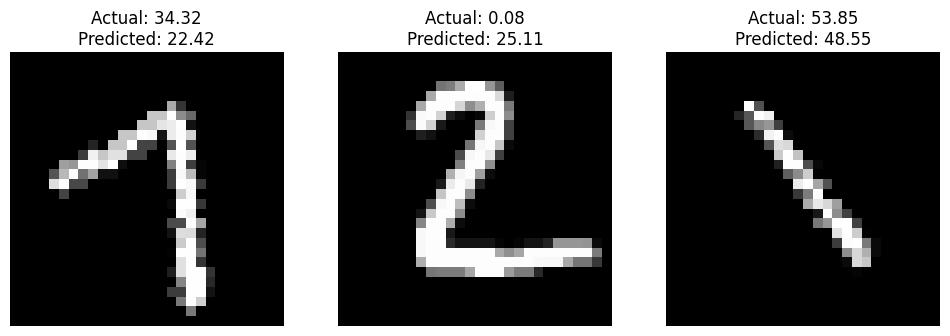

In [ ]:
show_loader = get_test_angle_dataset("MNIST", batch_size=3)

rotation_model.eval()
loaded_model.eval()
loaded_model.to(device)
rotation_model.to(device)

for images, actual_angles in show_loader:
    images = images.to(device)
    with torch.no_grad():
        features = loaded_model.base_model(images).to(device)
        predicted_angles = rotation_model(features).cpu().numpy().flatten()

    # Display the first batch of 3 examples
    display_examples(images, actual_angles.numpy(), predicted_angles, 3)
    break

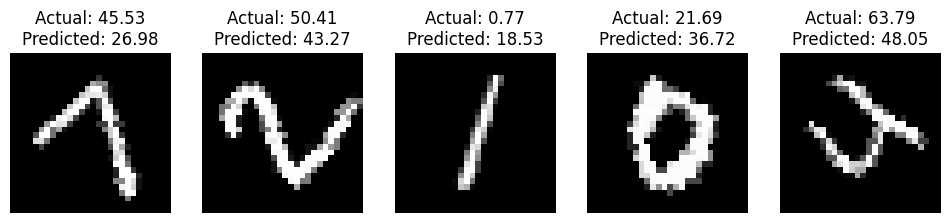

In [ ]:
show_loader = get_test_angle_dataset("MNIST", batch_size=5)

rotation_model.eval()
loaded_model.eval()
loaded_model.to(device)
rotation_model.to(device)

for images, actual_angles in show_loader:
    images = images.to(device)
    with torch.no_grad():
        features = loaded_model.base_model(images).to(device)
        predicted_angles = rotation_model(features).cpu().numpy().flatten()

    # Display the first batch of 5 examples
    display_examples(images, actual_angles.numpy(), predicted_angles, 5)
    break

In [ ]:
def test_rotation_regression(model, feature_extractor, data_loader, criterion, device):
    model.eval()
    feature_extractor.eval()
    total_loss = 0.0

    with torch.no_grad():
        for x, angle in tqdm(data_loader, desc="Testing"):
            x = x.to(device)
            angle = angle.to(device).float().unsqueeze(1)

            # features = feature_extractor(x)
            # # features = features.view(features.size(0), -1)  # Flatten features
            features=x
            outputs = model(features)
            loss = criterion(outputs, angle)
            total_loss += loss.item()

    avg_loss = total_loss / len(data_loader)
    print(f'Test Loss: {avg_loss}')
    return avg_loss


In [ ]:
test_loss = test_rotation_regression(rotation_model, feature_extractor, test_loader, criterion, device)

Testing: 100%|██████████| 157/157 [00:00<00:00, 730.76it/s]

Test Loss: 401.0009287451483


In [ ]:
test_loss

401.0009287451483

In [ ]:
class SimpleRotationRegression(nn.Module):
    def __init__(self, input_dim=512, hidden_dim=256, output_dim=1):
        super(SimpleRotationRegression, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.fc3 = nn.Linear(hidden_dim // 2, hidden_dim // 4)
        self.fc4 = nn.Linear(hidden_dim // 4, output_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

# Define the training function
def train_model(model, train_loader, criterion, optimizer, device, num_epochs=20):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for embeddings, angles in train_loader:
            embeddings, angles = embeddings.to(device), angles.to(device).float()
            optimizer.zero_grad()
            outputs = model(embeddings)
            loss = criterion(outputs.squeeze(), angles)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')

# Prepare dataset and dataloader
# Assuming `train_embeddings` and `train_labels` are numpy arrays containing your training data and labels
# train_embeddings = np.random.randn(1000, 512)  # Example data
# train_labels = np.random.uniform(0, 360, 1000)  # Example labels

# train_dataset = TensorDataset(torch.tensor(train_embeddings, dtype=torch.float32), torch.tensor(train_labels, dtype=torch.float32))
# train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4)

train_loader = get_angle_dataset("MNIST", batch_size=500)
all_embeddings = []
all_labels = []

loaded_model.eval()
with torch.no_grad():
    for images, targets in train_loader:
        images = images.to(device)
        features = loaded_model.base_model(images)
        all_embeddings.append(features.cpu().numpy())
        all_labels.append(targets.cpu().numpy())

train_embeddings = np.concatenate(all_embeddings, axis=0) ### embeddings on train
train_labels = np.concatenate(all_labels, axis=0) ### angles on train


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_embeddings = scaler.fit_transform(train_embeddings)


# Create a test dataset for the classification model
train_dataset = TensorDataset(torch.tensor(train_embeddings, dtype=torch.float32), torch.tensor(train_labels, dtype=torch.long))
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)

simple_emb_model = SimpleRotationRegression().to(device)
criterion = nn.MSELoss()
optimizer_emb_model = optim.Adam(simple_emb_model.parameters(), lr=0.00001)

# Train the model
train_model(simple_emb_model, train_loader, criterion, optimizer_emb_model, device, num_epochs=40)

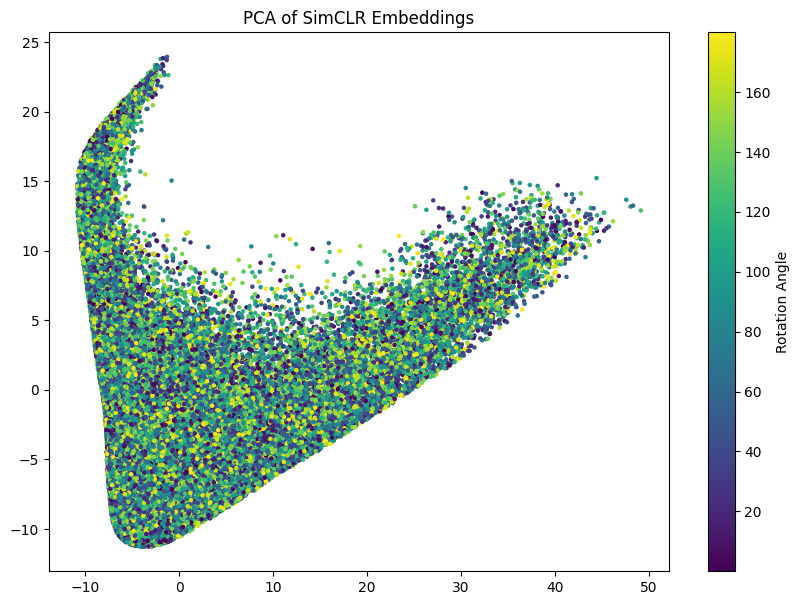

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Use PCA to reduce dimensionality for visualization
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(train_embeddings)

plt.figure(figsize=(10, 7))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=train_labels, cmap='viridis', s=5)
plt.colorbar(label='Rotation Angle')
plt.title('PCA of SimCLR Embeddings')
plt.show()


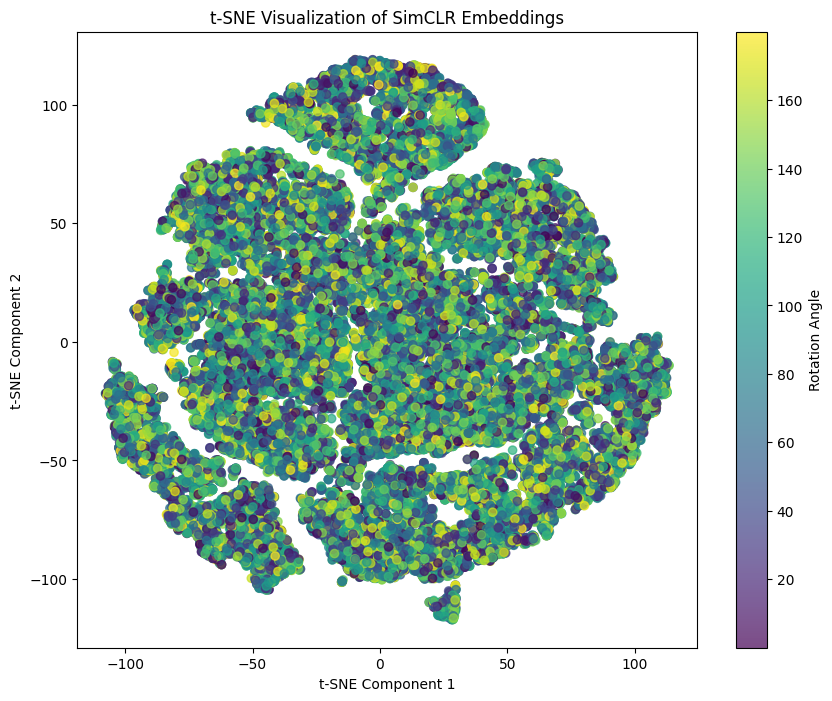

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Assuming test_embeddings and test_angles are already defined and loaded
# Flatten the test_angles to a 1D array if necessary
train_angles = train_labels.flatten()

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(train_embeddings)

# Plot the t-SNE results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=train_labels, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Rotation Angle')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization of SimCLR Embeddings')
plt.show()



### Direct angle prediction

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(128 * 3 * 3, 512)
        self.fc2 = nn.Linear(512, 1)  # Predicting a single value (angle)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(2)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.maxpool(x)
        x = self.relu(self.conv2(x))
        x = self.maxpool(x)
        x = self.relu(self.conv3(x))
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
# Define the training function
def train_bench_model(model, train_loader, criterion, optimizer, device, num_epochs=20):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, angles in train_loader:
            images, angles = images.to(device), angles.to(device).float()
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs.squeeze(), angles)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])
train_bench_loader = get_angle_dataset("MNIST", batch_size=500)

simple_cnn = SimpleCNN().to(device)
criterion = nn.MSELoss()
bench_optimizer = optim.Adam(simple_cnn.parameters(), lr=0.001)


train_bench_model(simple_cnn, train_bench_loader, criterion, bench_optimizer, device, num_epochs=20)

Epoch [1/20], Loss: 2623.6975
Epoch [2/20], Loss: 1058.3694
Epoch [3/20], Loss: 695.5451
Epoch [4/20], Loss: 591.3624
Epoch [5/20], Loss: 555.1143
Epoch [6/20], Loss: 481.2307
Epoch [7/20], Loss: 447.7395
Epoch [8/20], Loss: 414.5696
Epoch [9/20], Loss: 402.9962
Epoch [10/20], Loss: 374.7717
Epoch [11/20], Loss: 356.1615
Epoch [12/20], Loss: 339.2264
Epoch [13/20], Loss: 323.7753
Epoch [14/20], Loss: 319.2648
Epoch [15/20], Loss: 311.4380
Epoch [16/20], Loss: 302.4554
Epoch [17/20], Loss: 293.8728
Epoch [18/20], Loss: 283.6330
Epoch [19/20], Loss: 272.9814
Epoch [20/20], Loss: 259.6342


In [ ]:
def evaluate_model(model, test_loader, device):
    model.eval()
    total_loss = 0.0
    criterion = nn.MSELoss()
    with torch.no_grad():
        for images, angles in test_loader:
            images, angles = images.to(device), angles.to(device).float()
            outputs = model(images)
            loss = criterion(outputs.squeeze(), angles)
            total_loss += loss.item()

    avg_loss = total_loss / len(test_loader)
    print(f'Average Test Loss: {avg_loss:.4f}')
    return avg_loss


test_bench_loader = get_test_angle_dataset("MNIST", batch_size=64)

evaluate_model(simple_cnn, test_bench_loader, device)

Average Test Loss: 256.7158


256.7157992223266

## Apply intrinsic

### Preparations

In [ ]:
pip install giotto-ph gudhi pot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 554.6/554.6 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 53.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 835.4/835.4 kB 54.2 MB/s eta 0:00:00


In [ ]:
os.chdir('/')
if not os.path.exists("/intrinsic"):
    !git clone https://github.com/katyafilimoshina/intrinsic.git


Cloning into 'intrinsic'...
remote: Enumerating objects: 64, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 64 (delta 19), reused 59 (delta 14), pack-reused 0
Receiving objects: 100% (64/64), 28.68 KiB | 14.34 MiB/s, done.
Resolving deltas: 100% (19/19), done.


In [ ]:
!git pull origin main

fatal: not a git repository (or any of the parent directories): .git


In [ ]:
from intrinsic.functional.magnitude import magnitude
from intrinsic.functional.dimension import two_nn, mle
from intrinsic.functional.curvature import curvature
from intrinsic.functional.homology import vr_diagrams, drop_inf, betti, euler, diagrams_barycenter, persistence_entropy, persistence_norm, total_persistence, amplitude, landscapes, wasserstein_distance, cross_barcode, r_cross_barcode, mtd, rtd, frechet_mean

In [ ]:
def plot_feature(model, data, feature, results, num_epochs, layers, list_relative_depths):
    plt.figure(figsize=(12, 8))
    for epoch in range(num_epochs):
      plt.plot(list_relative_depths[0:len(layers)+1], results[epoch * len(layers):epoch * len(layers)+len(layers)], label=f'Epoch {epoch*5 + 1}', marker='o')
    plt.xlabel('Relative depth')
    plt.ylabel(f'{feature}')
    plt.title(f'{model} | {data} | {feature} over layers on different epochs')
    plt.legend(title='Epochs')
    plt.show()

### For all test

#### ID

In [ ]:
def id_experiment(list_embs, k=10):
  ids_mle, ids_two_nn = [], []
  for num_emb in range(len(list_embs)):
    ids_two_nn.append(two_nn(list_embs[num_emb]))
    ids_mle.append(mle(list_embs[num_emb], k).mean())
  return ids_two_nn, ids_mle

In [ ]:
reduced_embs = []

for embeddings in list_embs:
    reduced_embs.append(embeddings[:15000])

for i, reduced_embeddings in enumerate(reduced_embs):
    print(f"Epoch {i+1}, Reduced Embedding shape: {reduced_embeddings.shape}")

Epoch 1, Reduced Embedding shape: (15000, 3136)
Epoch 2, Reduced Embedding shape: (15000, 2048)
Epoch 3, Reduced Embedding shape: (15000, 1024)
Epoch 4, Reduced Embedding shape: (15000, 512)
Epoch 5, Reduced Embedding shape: (15000, 3136)
Epoch 6, Reduced Embedding shape: (15000, 2048)
Epoch 7, Reduced Embedding shape: (15000, 1024)
Epoch 8, Reduced Embedding shape: (15000, 512)
Epoch 9, Reduced Embedding shape: (15000, 3136)
Epoch 10, Reduced Embedding shape: (15000, 2048)
Epoch 11, Reduced Embedding shape: (15000, 1024)
Epoch 12, Reduced Embedding shape: (15000, 512)
Epoch 13, Reduced Embedding shape: (15000, 3136)
Epoch 14, Reduced Embedding shape: (15000, 2048)
Epoch 15, Reduced Embedding shape: (15000, 1024)
Epoch 16, Reduced Embedding shape: (15000, 512)
Epoch 17, Reduced Embedding shape: (15000, 3136)
Epoch 18, Reduced Embedding shape: (15000, 2048)
Epoch 19, Reduced Embedding shape: (15000, 1024)
Epoch 20, Reduced Embedding shape: (15000, 512)
Epoch 21, Reduced Embedding shape:

In [ ]:
ids_two_nn_simclr, ids_mle_simclr = id_experiment(reduced_embs)

In [ ]:
ids_two_nn_simclr, ids_mle_simclr

([26.866335803524482,
  30.396494496087055,
  29.92098241032185,
  28.58194796503069,
  14.82133821385479,
  12.821803608040177,
  11.667165787377833,
  6.690691585158262,
  13.845262333507637,
  12.012688079867424,
  10.971140501944465,
  6.14451345379545,
  13.463079907806046,
  11.499838727334508,
  10.808969264847423,
  5.886836017843006,
  13.334362342251294,
  11.59865925597837,
  10.764936511301935,
  5.778709801042003,
  13.042176393521077,
  11.214827528393077,
  10.635047013553642,
  5.7378876048020615,
  12.879023248809006,
  11.06989160926435,
  10.477618082314237,
  5.776201098854908,
  12.693237727696753,
  10.931348080987531,
  10.322475234767083,
  6.255625196421281,
  12.788705387085656,
  10.95596521658656,
  10.633148679086595,
  6.074387494139256,
  12.780313991907937,
  10.863130150295886,
  10.101341893847257,
  6.021860687888124,
  12.488975617381644,
  10.777128439774124,
  10.333623897879724,
  5.962441914319367],
 [30.678111803407525,
  37.40028097839593,
  37

In [ ]:
ids_two_nn_normalized, ids_mle_normalized = [], []
for i in range(len(ids_two_nn_simclr)):
  ids_two_nn_normalized.append(ids_two_nn_simclr[i] / reduced_embs[i].shape[1])
  ids_mle_normalized.append(ids_mle_simclr[i] / reduced_embs[i].shape[1])

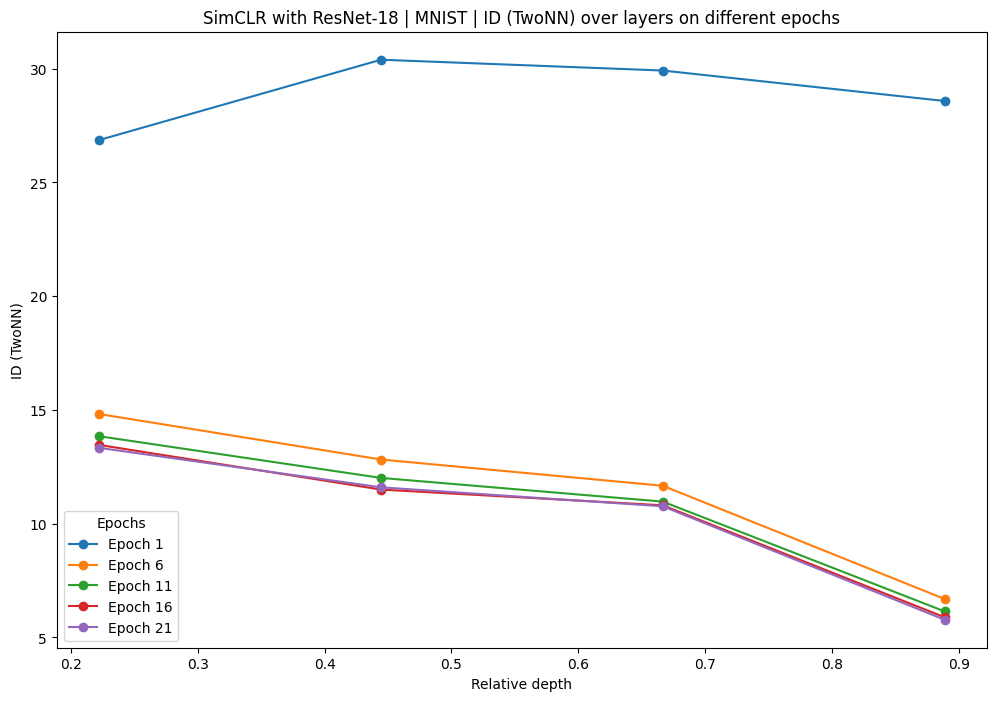

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature="ID (TwoNN)", results=ids_two_nn_simclr, num_epochs=5, layers=layers_simclr, list_relative_depths=normalized_depths)

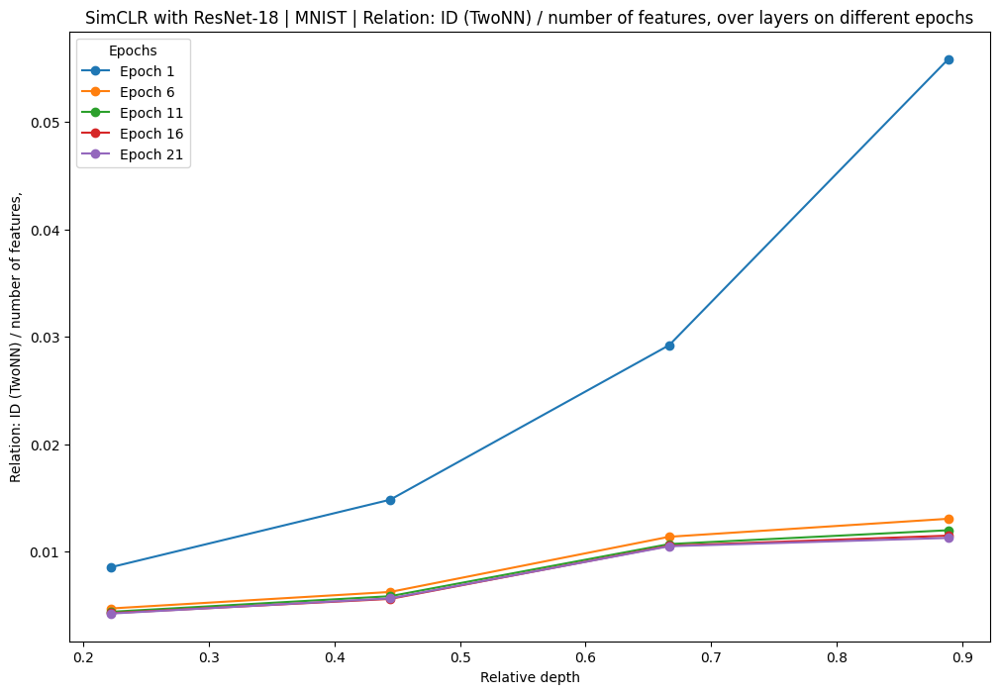

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature="Relation: ID (TwoNN) / number of features,", results=ids_two_nn_normalized, num_epochs=5, layers=layers_simclr, list_relative_depths=normalized_depths)

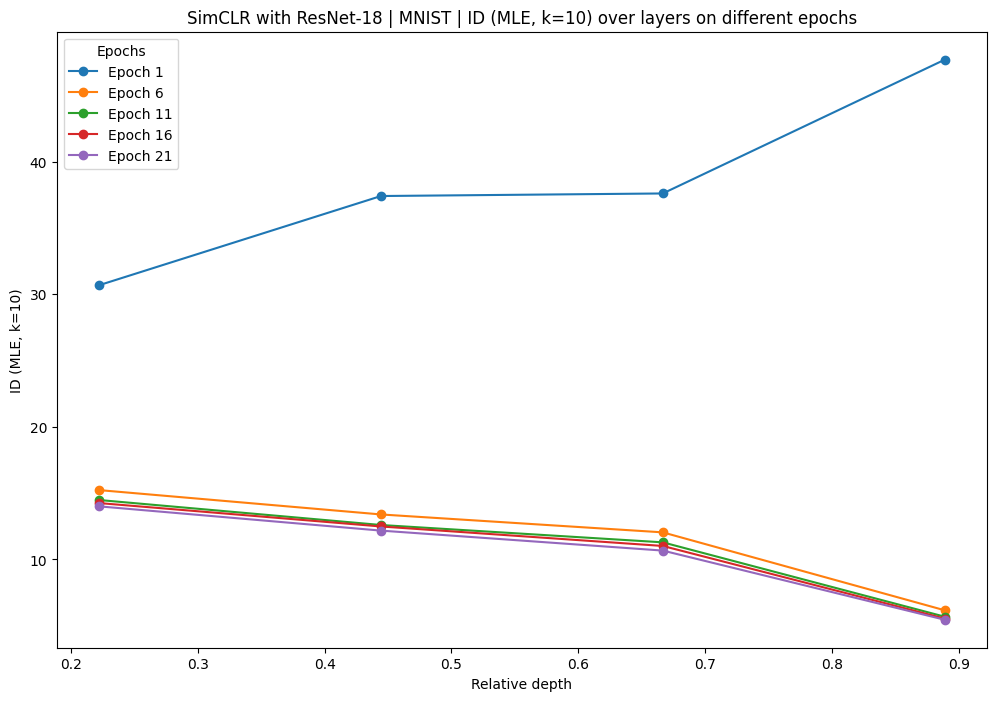

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature="ID (MLE, k=10)", results=ids_mle_simclr, num_epochs=5, layers=layers_simclr, list_relative_depths=normalized_depths)

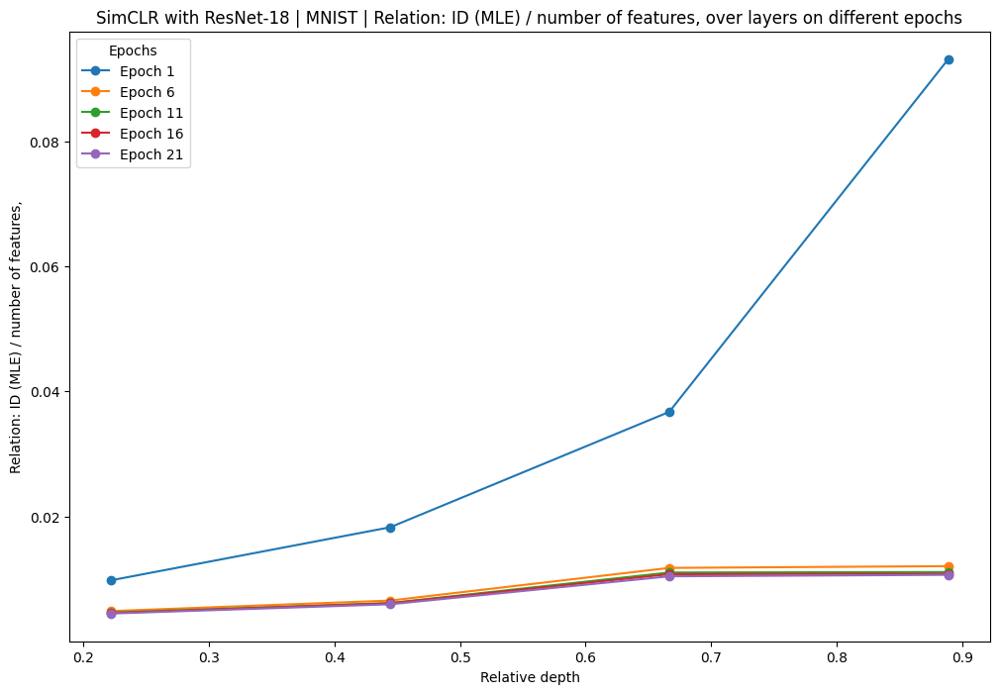

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature="Relation: ID (MLE) / number of features,", results=ids_mle_normalized, num_epochs=5, layers=layers_simclr, list_relative_depths=normalized_depths)

In [ ]:
loaded_model

SimCLR(
  (base_model): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_r

#### Magnitude

In [ ]:
def magnitude_experiment(list_embs):
  magnitudes = []
  for num_emb in range(len(list_embs)):
    magnitudes.append(magnitude(list_embs[num_emb]))
  return magnitudes

In [ ]:
reduced_embs = []

for embeddings in list_embs:
    reduced_embs.append(embeddings[:300])

for i, reduced_embeddings in enumerate(reduced_embs):
    print(f"Epoch {i+1}, Reduced Embedding shape: {reduced_embeddings.shape}")

Epoch 1, Reduced Embedding shape: (300, 3136)
Epoch 2, Reduced Embedding shape: (300, 2048)
Epoch 3, Reduced Embedding shape: (300, 1024)
Epoch 4, Reduced Embedding shape: (300, 512)
Epoch 5, Reduced Embedding shape: (300, 3136)
Epoch 6, Reduced Embedding shape: (300, 2048)
Epoch 7, Reduced Embedding shape: (300, 1024)
Epoch 8, Reduced Embedding shape: (300, 512)
Epoch 9, Reduced Embedding shape: (300, 3136)
Epoch 10, Reduced Embedding shape: (300, 2048)
Epoch 11, Reduced Embedding shape: (300, 1024)
Epoch 12, Reduced Embedding shape: (300, 512)
Epoch 13, Reduced Embedding shape: (300, 3136)
Epoch 14, Reduced Embedding shape: (300, 2048)
Epoch 15, Reduced Embedding shape: (300, 1024)
Epoch 16, Reduced Embedding shape: (300, 512)
Epoch 17, Reduced Embedding shape: (300, 3136)
Epoch 18, Reduced Embedding shape: (300, 2048)
Epoch 19, Reduced Embedding shape: (300, 1024)
Epoch 20, Reduced Embedding shape: (300, 512)
Epoch 21, Reduced Embedding shape: (300, 3136)
Epoch 22, Reduced Embedding

In [ ]:
magnitudes = magnitude_experiment(reduced_embs)

In [ ]:
magnitudes

[299.99999999988734,
 299.999999800415,
 299.9999886111938,
 299.9999725211022,
 299.999999879533,
 299.9999903161536,
 299.90646292397315,
 297.9221001877877,
 299.9999999997951,
 299.9999955619874,
 299.904618457498,
 298.5841439851493,
 299.9999999998482,
 299.99999931227967,
 299.91041468783806,
 298.44208504887234,
 299.9999999950978,
 299.99994818178163,
 299.80227260599133,
 298.43200698321704,
 299.9999999991648,
 299.9999927205595,
 299.6121546011823,
 298.3686451273704,
 299.99999971761315,
 299.99980860806966,
 299.5469761135024,
 297.9097032116954,
 299.99999999989114,
 299.9999787552595,
 299.6096605334627,
 298.84884172750947,
 299.99999999930986,
 299.99996443788314,
 299.7859884305071,
 299.2639398714195,
 299.99999997488305,
 299.9996674351793,
 299.41341648206765,
 299.1534676608913,
 299.9999999988777,
 299.99997695489503,
 299.8358569698452,
 299.76649004477514]

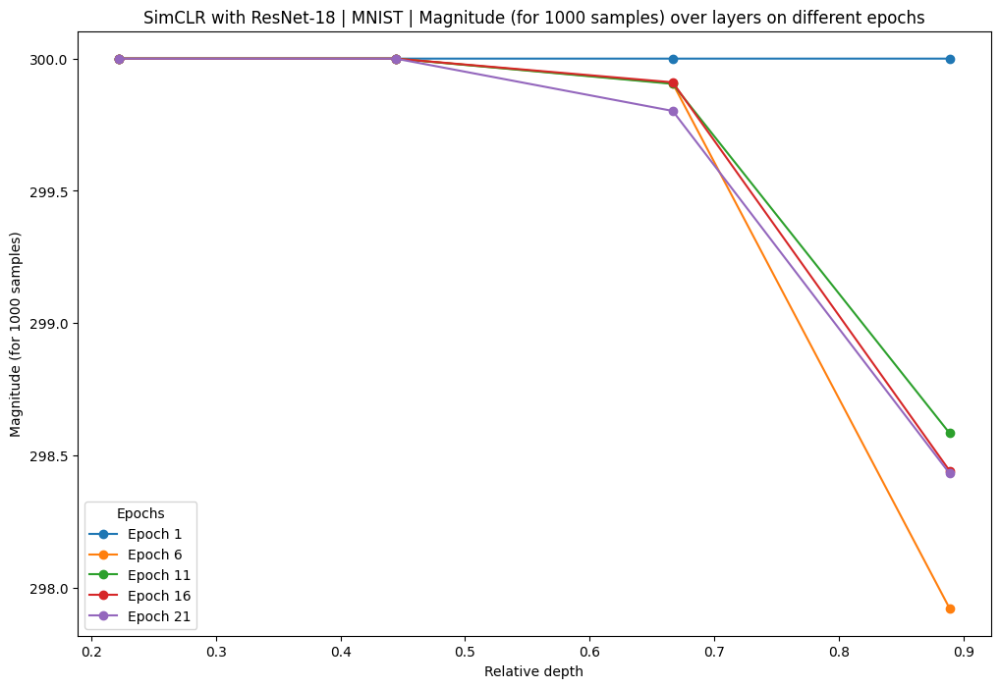

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature='Magnitude (for 1000 samples)', results=magnitudes, num_epochs=5, layers=layers_simclr[-5:], list_relative_depths=normalized_depths)

#### Curvature

In [ ]:
def curvature_experiment(list_embs, k=3):
  curvatures = []
  for num_emb in range(len(list_embs)):
    curvatures.append(np.ma.masked_invalid(curvature(list_embs[num_emb], k)).mean())
  return curvatures

In [ ]:
curvatures = curvature_experiment(normalized_embs)

In [ ]:
curvatures

[masked,
 masked,
 -1.0531557942878041e+266,
 -2.4300831341051155e+136,
 -1.6528986037808117e+112,
 -4590095621042272.0,
 masked,
 masked,
 masked,
 -5.183359736490712e+144,
 -1.1174545038228793e+131,
 -2.7905527212133374e+20,
 masked,
 masked,
 masked,
 -1.6832723644120752e+132,
 -1.5498368016036123e+123,
 -2.633130540504003e+16,
 masked,
 masked,
 masked,
 -1.8695131022634515e+161,
 -1.2252329255446969e+154,
 -3.8013312670756683e+23,
 masked,
 masked,
 masked,
 -1.4256895753541072e+103,
 -7.777895235409942e+113,
 -9.339527235092607e+20]

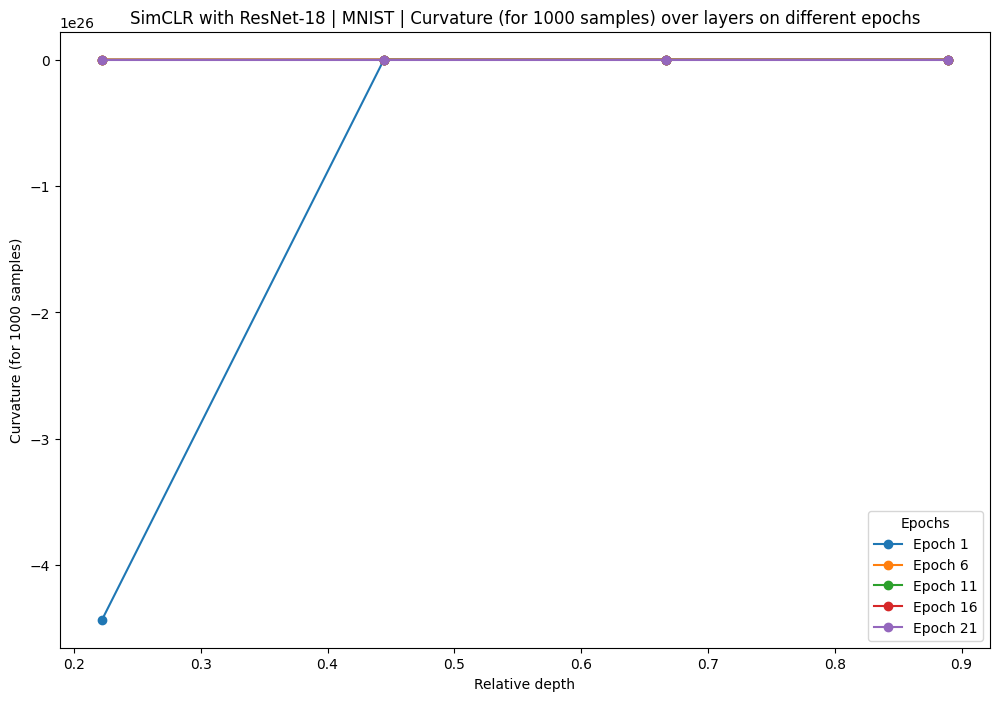

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature='Curvature (for 1000 samples)', results=curvatures, num_epochs=5, layers=layers_simclr[-5:], list_relative_depths=normalized_depths)

#### Persistence diagrams

In [ ]:
pip install persim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18101 sha256=88f3bd771d283e58e450112ef1b4c378130bf54af23695674105a9b797d241d1
  Stored in directory: /root/.cache/pip/wheels/ef/0f/3b/0f931844eecc34addd90e72d54cd39c08b7066c5f25c00b9a4
Successfully built hopcroftkarp


In [ ]:
import persim
from sklearn.preprocessing import normalize

In [ ]:
reduced_embs = []

for embeddings in list_embs:
    reduced_embs.append(embeddings[:500])

for i, reduced_embeddings in enumerate(reduced_embs):
    print(f"Epoch {i+1}, Reduced Embedding shape: {reduced_embeddings.shape}")

Epoch 1, Reduced Embedding shape: (500, 3136)
Epoch 2, Reduced Embedding shape: (500, 2048)
Epoch 3, Reduced Embedding shape: (500, 1024)
Epoch 4, Reduced Embedding shape: (500, 512)
Epoch 5, Reduced Embedding shape: (500, 3136)
Epoch 6, Reduced Embedding shape: (500, 2048)
Epoch 7, Reduced Embedding shape: (500, 1024)
Epoch 8, Reduced Embedding shape: (500, 512)
Epoch 9, Reduced Embedding shape: (500, 3136)
Epoch 10, Reduced Embedding shape: (500, 2048)
Epoch 11, Reduced Embedding shape: (500, 1024)
Epoch 12, Reduced Embedding shape: (500, 512)
Epoch 13, Reduced Embedding shape: (500, 3136)
Epoch 14, Reduced Embedding shape: (500, 2048)
Epoch 15, Reduced Embedding shape: (500, 1024)
Epoch 16, Reduced Embedding shape: (500, 512)
Epoch 17, Reduced Embedding shape: (500, 3136)
Epoch 18, Reduced Embedding shape: (500, 2048)
Epoch 19, Reduced Embedding shape: (500, 1024)
Epoch 20, Reduced Embedding shape: (500, 512)
Epoch 21, Reduced Embedding shape: (500, 3136)
Epoch 22, Reduced Embedding

In [ ]:
normalized_embs = []
for emb in reduced_embs:
  normalized_embs.append(normalize(emb, axis=0, norm='max'))

In [ ]:
def get_vr_diagrams(normalized_embs):
  vrs = []
  for i in range(len(normalized_embs)):
    vrs.append(drop_inf(vr_diagrams(normalized_embs[i])))
  return vrs

In [ ]:
vrs2 = []
for i in range(len(normalized_embs)):
  vrs2.append(drop_inf(vr_diagrams(normalized_embs[i], maxdim=2)))

In [ ]:
vrs = get_vr_diagrams(normalized_embs)
vrs

[[array([[ 0.       ,  3.9292924],
         [ 0.       ,  4.1605535],
         [ 0.       ,  4.5536327],
         [ 0.       ,  4.598513 ],
         [ 0.       ,  4.622031 ],
         [ 0.       ,  4.6321325],
         [ 0.       ,  4.7097254],
         [ 0.       ,  4.763767 ],
         [ 0.       ,  4.794315 ],
         [ 0.       ,  4.8601346],
         [ 0.       ,  4.9824233],
         [ 0.       ,  5.127389 ],
         [ 0.       ,  5.1529536],
         [ 0.       ,  5.1610065],
         [ 0.       ,  5.177098 ],
         [ 0.       ,  5.1786976],
         [ 0.       ,  5.261355 ],
         [ 0.       ,  5.304248 ],
         [ 0.       ,  5.3835464],
         [ 0.       ,  5.424539 ],
         [ 0.       ,  5.486313 ],
         [ 0.       ,  5.5800533],
         [ 0.       ,  5.597094 ],
         [ 0.       ,  5.635319 ],
         [ 0.       ,  5.636212 ],
         [ 0.       ,  5.6382394],
         [ 0.       ,  5.6795917],
         [ 0.       ,  5.699384 ],
         [ 0.       

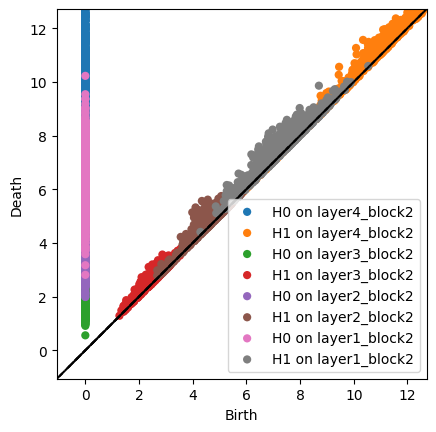

In [ ]:
for i in range(4):
  persim.plot_diagrams(vrs[-i], labels=[f'H0 on {layers_simclr[-i-1]}', f'H1 on {layers_simclr[-i-1]}'], size=35)

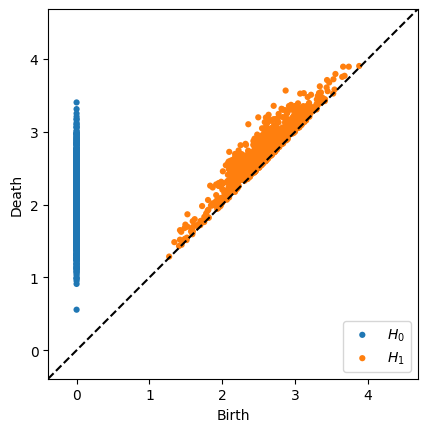

In [ ]:
persim.plot_diagrams(vrs[-1])

In [ ]:
layers_simclr.sort()

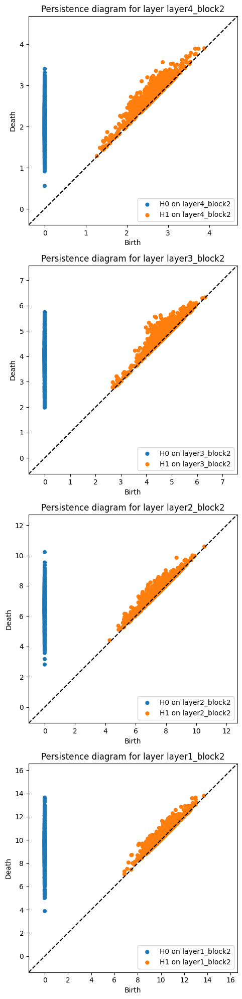

In [ ]:
num_diagrams = 4 # Number of diagrams to plot
fig, axes = plt.subplots(num_diagrams, 1, figsize=(10, num_diagrams * 5))

for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs[-(i+1)], labels=[f'H0 on {layers_simclr[-(i+1)]}', f'H1 on {layers_simclr[-(i+1)]}'], size=35, ax=ax)
    ax.set_title(f'Persistence diagram for layer {layers_simclr[-(i+1)]}')

plt.tight_layout()
plt.show()

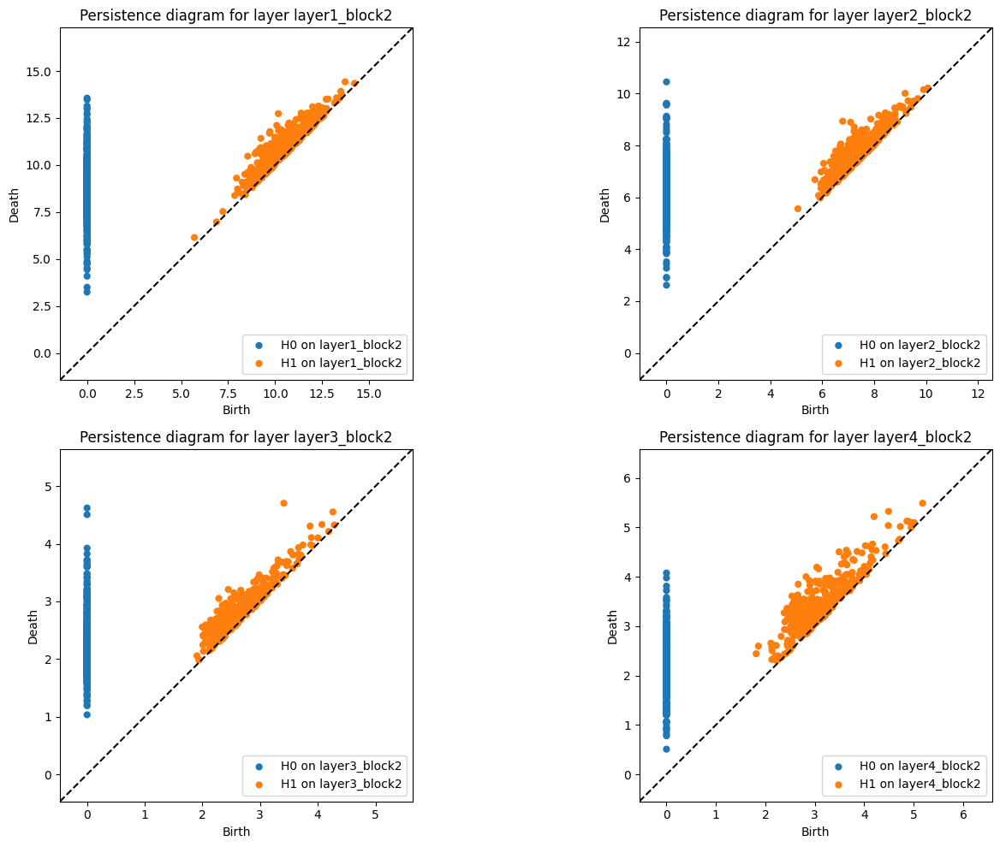

In [ ]:
num_diagrams = 4  # Number of diagrams to plot
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # 2 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs[-(num_diagrams-i)], labels=[f'H0 on {layers_simclr[-(num_diagrams-i)]}', f'H1 on {layers_simclr[-(num_diagrams-i)]}'], size=35, ax=ax)
    ax.set_title(f'Persistence diagram for layer {layers_simclr[-(num_diagrams-i)]}')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


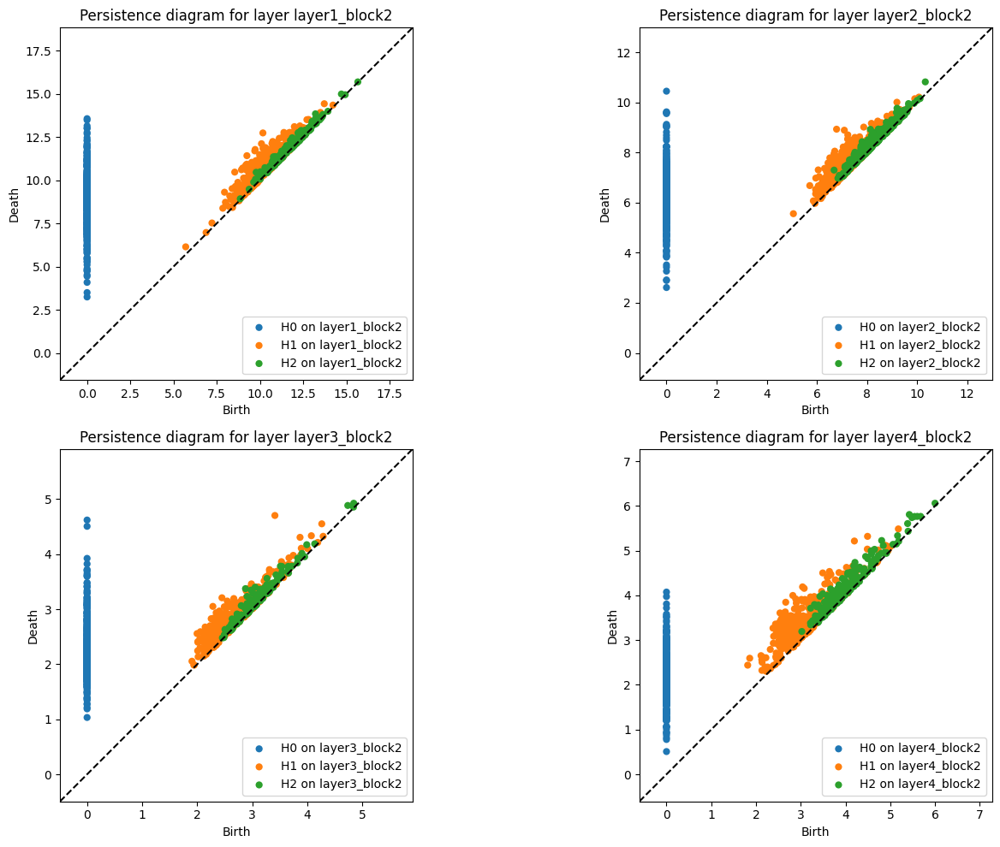

In [ ]:
num_diagrams = 4  # Number of diagrams to plot
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # 2 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs2[-(num_diagrams-i)], labels=[f'H0 on {layers_simclr[-(num_diagrams-i)]}', f'H1 on {layers_simclr[-(num_diagrams-i)]}', f'H2 on {layers_simclr[-(num_diagrams-i)]}'], size=35, ax=ax)
    ax.set_title(f'Persistence diagram for layer {layers_simclr[-(num_diagrams-i)]}')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


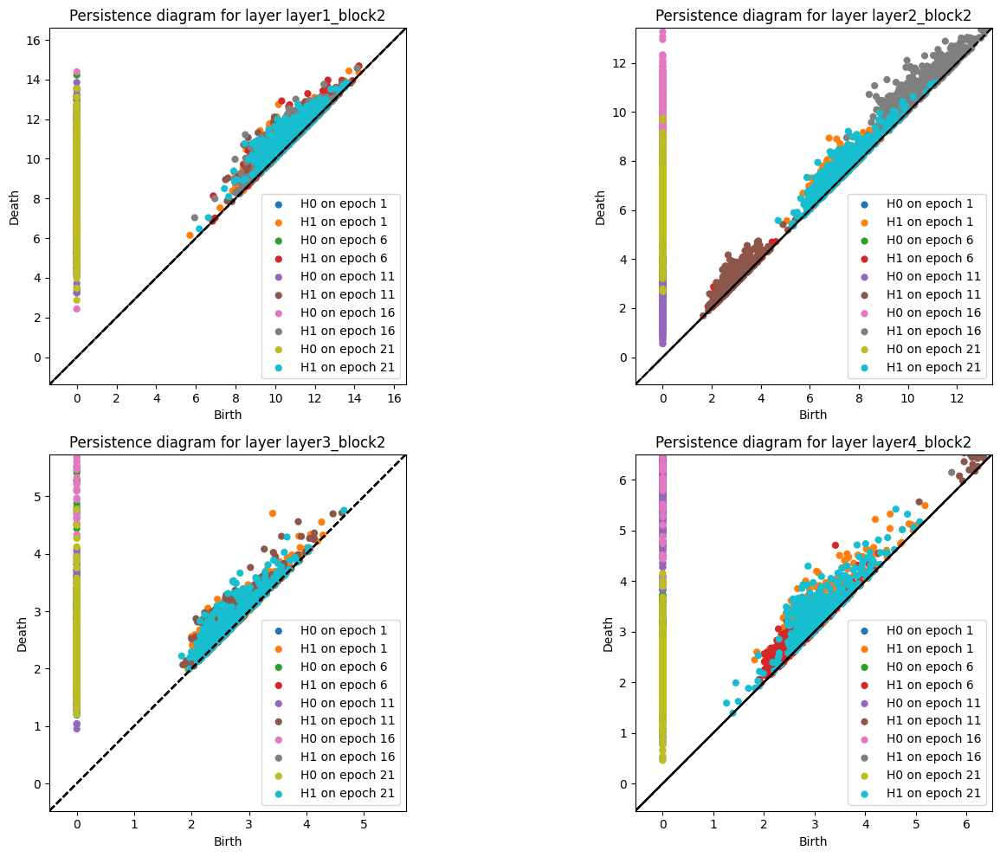

In [ ]:
num_diagrams = 4  # Number of diagrams to plot
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # 2 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    for epoch in range(1,6):
      persim.plot_diagrams(vrs[-epoch*(num_diagrams-i)], labels=[f'H0 on epoch {epoch*5-4}', f'H1 on epoch {epoch*5-4}'], size=35, ax=ax)
      ax.set_title(f'Persistence diagram for layer {layers_simclr[-(num_diagrams-i)]}')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### Total persistence

In [ ]:
def total_persistence_experiment(vrs, q):
  total_persistences = []
  for num_emb in range(len(vrs)):
    total_persistences.append(total_persistence(vrs[num_emb], q))
    print(f'Epoch: {list_epochs[num_emb]} | Layer: {list_layers[num_emb]} | Total persistence: {total_persistences[num_emb]}')
  return total_persistences

In [ ]:
total_p_half = total_persistence_experiment(vrs, q=0.5)

Epoch: 1 | Layer: layer1_block2 | Total persistence: 3228.05810546875
Epoch: 1 | Layer: layer2_block2 | Total persistence: 2887.457763671875
Epoch: 1 | Layer: layer3_block2 | Total persistence: 2377.64697265625
Epoch: 1 | Layer: layer4_block2 | Total persistence: 2185.906982421875
Epoch: 6 | Layer: layer1_block2 | Total persistence: 3567.361328125
Epoch: 6 | Layer: layer2_block2 | Total persistence: 3097.58056640625
Epoch: 6 | Layer: layer3_block2 | Total persistence: 2272.38818359375
Epoch: 6 | Layer: layer4_block2 | Total persistence: 1538.68994140625
Epoch: 11 | Layer: layer1_block2 | Total persistence: 3627.9111328125
Epoch: 11 | Layer: layer2_block2 | Total persistence: 3115.290771484375
Epoch: 11 | Layer: layer3_block2 | Total persistence: 2363.55810546875
Epoch: 11 | Layer: layer4_block2 | Total persistence: 1620.4306640625
Epoch: 16 | Layer: layer1_block2 | Total persistence: 3638.642578125
Epoch: 16 | Layer: layer2_block2 | Total persistence: 3111.9453125
Epoch: 16 | Layer: la

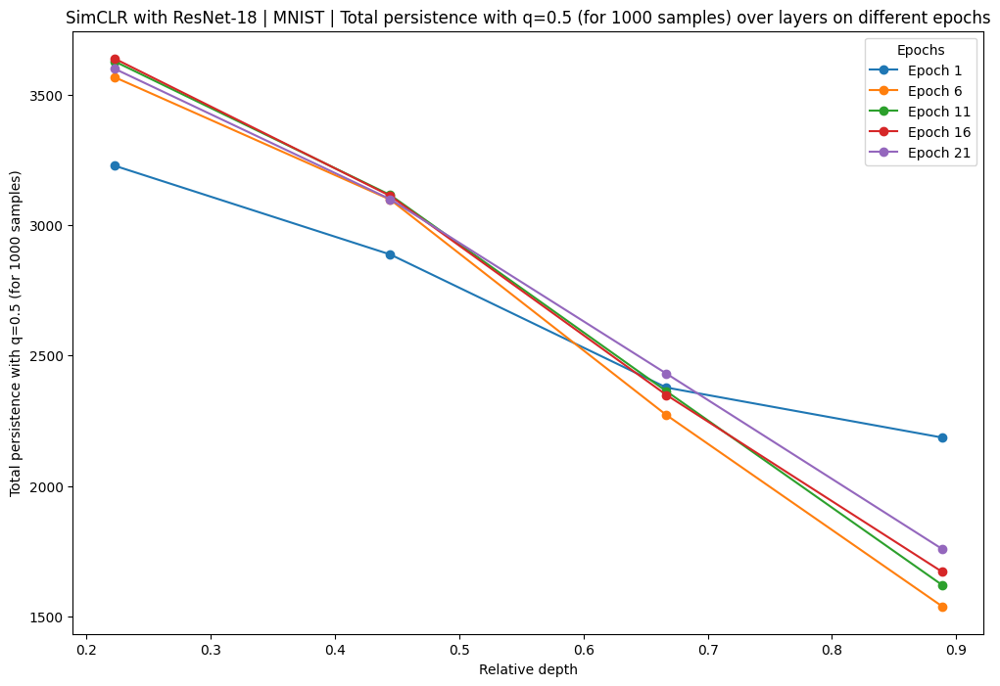

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature='Total persistence with q=0.5 (for 1000 samples)', results=total_p_half, num_epochs=5, layers=layers_simclr[-4:], list_relative_depths=normalized_depths)

In [ ]:
total_p_full = total_persistence_experiment(vrs, q=1)

Epoch: 1 | Layer: layer1_block2 | Total persistence: 9124.54296875
Epoch: 1 | Layer: layer2_block2 | Total persistence: 7483.59375
Epoch: 1 | Layer: layer3_block2 | Total persistence: 5007.9990234375
Epoch: 1 | Layer: layer4_block2 | Total persistence: 4210.818359375
Epoch: 6 | Layer: layer1_block2 | Total persistence: 9571.23828125
Epoch: 6 | Layer: layer2_block2 | Total persistence: 6737.4541015625
Epoch: 6 | Layer: layer3_block2 | Total persistence: 3699.119873046875
Epoch: 6 | Layer: layer4_block2 | Total persistence: 1729.8994140625
Epoch: 11 | Layer: layer1_block2 | Total persistence: 9705.37109375
Epoch: 11 | Layer: layer2_block2 | Total persistence: 6876.99853515625
Epoch: 11 | Layer: layer3_block2 | Total persistence: 3933.237060546875
Epoch: 11 | Layer: layer4_block2 | Total persistence: 1877.7449951171875
Epoch: 16 | Layer: layer1_block2 | Total persistence: 9794.5537109375
Epoch: 16 | Layer: layer2_block2 | Total persistence: 6871.375
Epoch: 16 | Layer: layer3_block2 | Tota

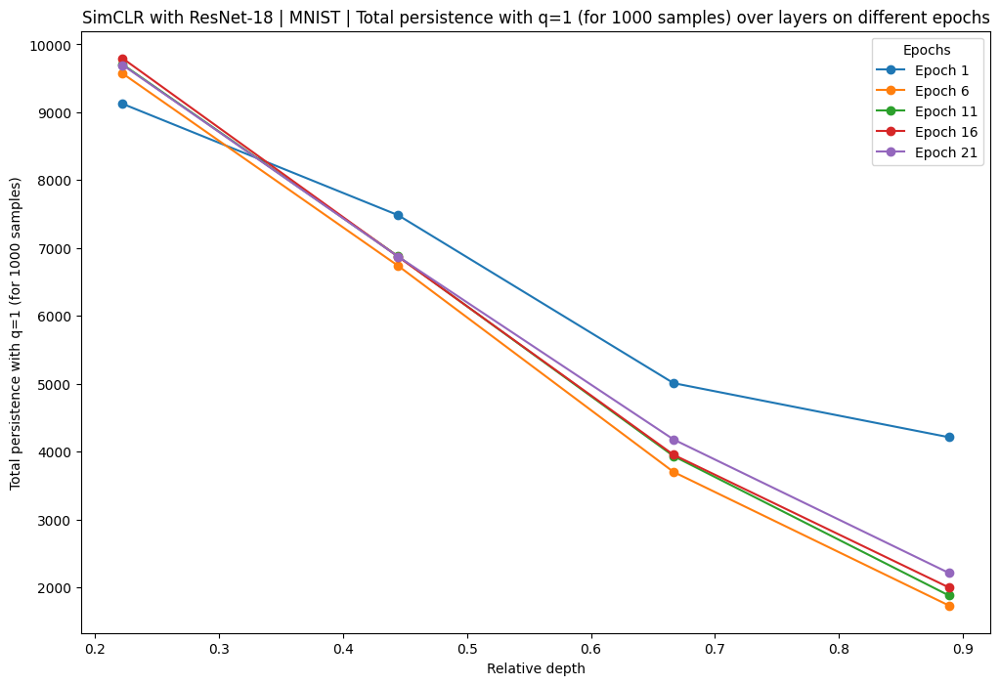

In [ ]:
plot_feature(model="SimCLR with ResNet-18", data="MNIST", feature='Total persistence with q=1 (for 1000 samples)', results=total_p_full, num_epochs=5, layers=layers_simclr[-4:], list_relative_depths=normalized_depths)

#### Persistence entropy

In [ ]:
from intrinsic.functional.homology import persistence_entropy

In [ ]:
vrs[0][1]

array([[14.930616 , 14.954631 ],
       [14.929781 , 15.275088 ],
       [14.591104 , 14.637769 ],
       ...,
       [ 4.5617123,  4.565309 ],
       [ 4.4363117,  4.5386405],
       [ 4.429324 ,  4.496903 ]], dtype=float32)

In [ ]:
def persistence_entropy_experiment(vrs):
  persistence_entropies = []
  for num_emb in range(len(vrs)):
    persistence_entropies.append(persistence_entropy(vrs[num_emb]))
    print(f'Epoch: {list_epochs[num_emb]} | Layer: {list_layers[num_emb]} | Persistent entropies (for H0, H1): {persistence_entropies[num_emb]}')
  return persistence_entropies

In [ ]:
persistent_entropies = persistence_entropy_experiment(vrs)

Epoch: 1 | Layer: layer1_block2 | Persistent entropies (for H0, H1): [6.86821   6.0072303]
Epoch: 1 | Layer: layer2_block2 | Persistent entropies (for H0, H1): [6.8786716 5.921482 ]
Epoch: 1 | Layer: layer3_block2 | Persistent entropies (for H0, H1): [6.8764257 6.0467906]
Epoch: 1 | Layer: layer4_block2 | Persistent entropies (for H0, H1): [6.8903103 6.037171 ]
Epoch: 6 | Layer: layer1_block2 | Persistent entropies (for H0, H1): [6.8922386 6.5615396]
Epoch: 6 | Layer: layer2_block2 | Persistent entropies (for H0, H1): [6.8920164 6.737172 ]
Epoch: 6 | Layer: layer3_block2 | Persistent entropies (for H0, H1): [6.892337 6.561877]
Epoch: 6 | Layer: layer4_block2 | Persistent entropies (for H0, H1): [6.8820496 6.3104   ]
Epoch: 11 | Layer: layer1_block2 | Persistent entropies (for H0, H1): [6.8929873 6.639137 ]
Epoch: 11 | Layer: layer2_block2 | Persistent entropies (for H0, H1): [6.8924084 6.737126 ]
Epoch: 11 | Layer: layer3_block2 | Persistent entropies (for H0, H1): [6.8921723 6.626773 

In [ ]:
persistent_entropies

[array([6.86821  , 6.0072303], dtype=float32),
 array([6.8786716, 5.921482 ], dtype=float32),
 array([6.8764257, 6.0467906], dtype=float32),
 array([6.8903103, 6.037171 ], dtype=float32),
 array([6.8922386, 6.5615396], dtype=float32),
 array([6.8920164, 6.737172 ], dtype=float32),
 array([6.892337, 6.561877], dtype=float32),
 array([6.8820496, 6.3104   ], dtype=float32),
 array([6.8929873, 6.639137 ], dtype=float32),
 array([6.8924084, 6.737126 ], dtype=float32),
 array([6.8921723, 6.626773 ], dtype=float32),
 array([6.88203  , 6.3828545], dtype=float32),
 array([6.89357 , 6.655575], dtype=float32),
 array([6.893299 , 6.7394886], dtype=float32),
 array([6.894425 , 6.5584593], dtype=float32),
 array([6.883893, 6.417976], dtype=float32),
 array([6.89423 , 6.605413], dtype=float32),
 array([6.8926125, 6.7241936], dtype=float32),
 array([6.891968, 6.606424], dtype=float32),
 array([6.885314, 6.466587], dtype=float32)]

#### RTD Score between the embeddings

In [ ]:
from intrinsic.functional.homology import wasserstein_distance, rtd

In [ ]:
rtd(normalized_embs[-1], normalized_embs[-2])

array([  0.        , 109.64613891])

In [ ]:
rtd(normalized_embs[-1], normalized_embs[-5])

array([  0.        , 762.11422622])

In [ ]:
rtd(normalized_embs[-2], normalized_embs[-6])

array([   0.        , 1101.37126017])

In [ ]:
rtd(normalized_embs[-1], normalized_embs[-9])

array([  0.        , 827.74979717])

In [ ]:
rtd(normalized_embs[-1], normalized_embs[-13])

array([  0.        , 878.16023594])

### By rotation angle bins

In [ ]:
def categorize_angles(angles):
    categories = np.digitize(angles, bins=np.arange(20, 360, 20))
    return categories

In [ ]:
categories = categorize_angles(test_labels)

category_dict = {i: [] for i in range(18)}

for i, category in enumerate(categories):
    category_dict[category].append(test_embeddings[i])

for category in category_dict:
    category_dict[category] = np.array(category_dict[category])

for category, embeddings in category_dict.items():
    print(f"Category {category}: {embeddings.shape[0]} samples")

Category 0: 553 samples
Category 1: 519 samples
Category 2: 559 samples
Category 3: 557 samples
Category 4: 564 samples
Category 5: 588 samples
Category 6: 535 samples
Category 7: 554 samples
Category 8: 578 samples
Category 9: 550 samples
Category 10: 568 samples
Category 11: 579 samples
Category 12: 540 samples
Category 13: 525 samples
Category 14: 595 samples
Category 15: 572 samples
Category 16: 528 samples
Category 17: 536 samples


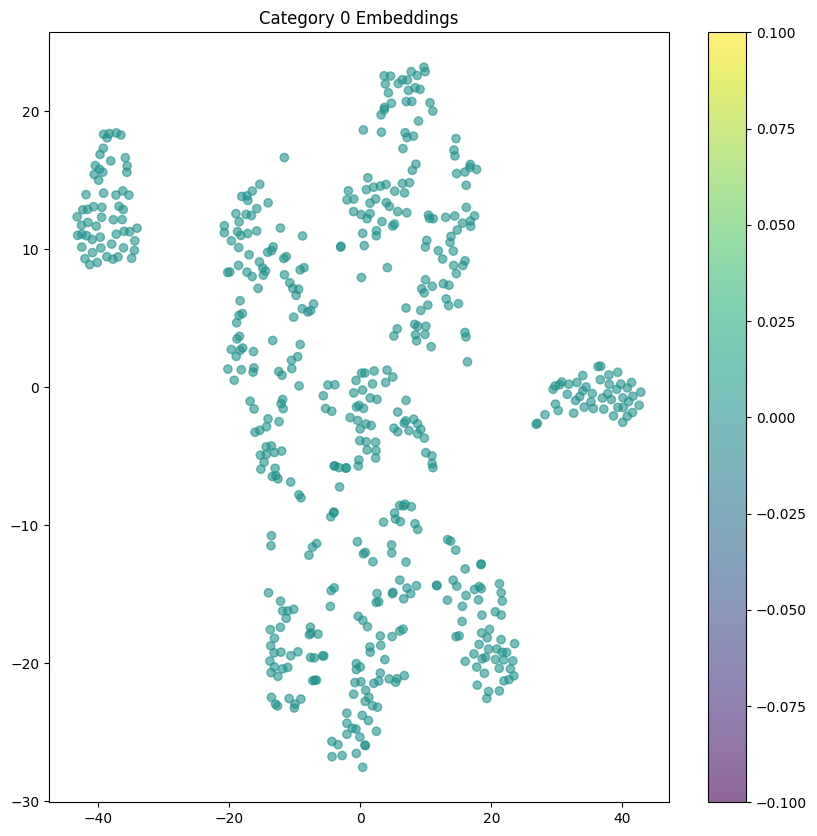

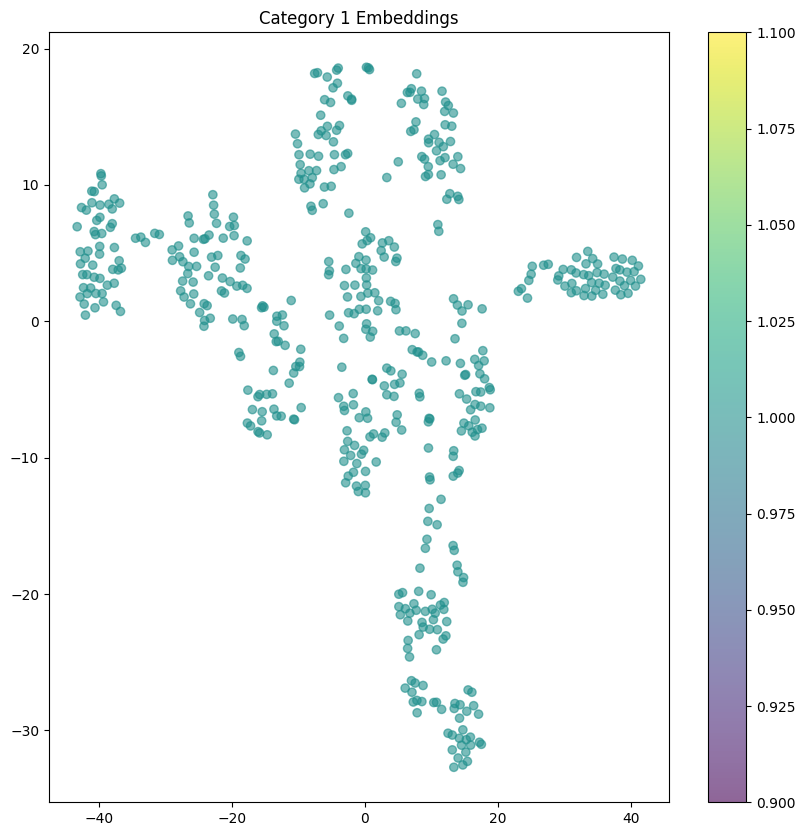

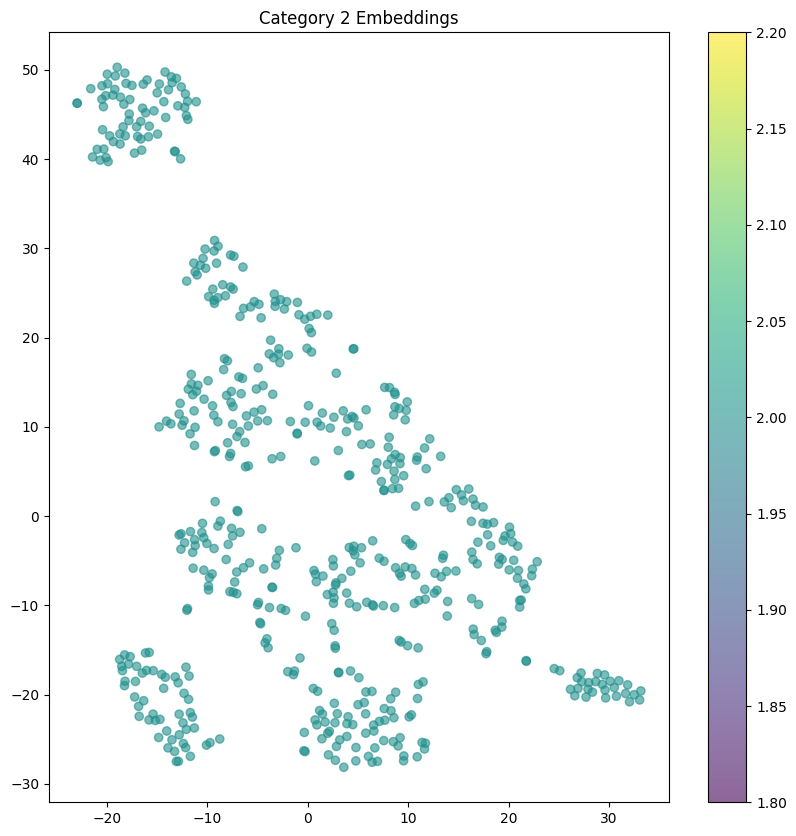

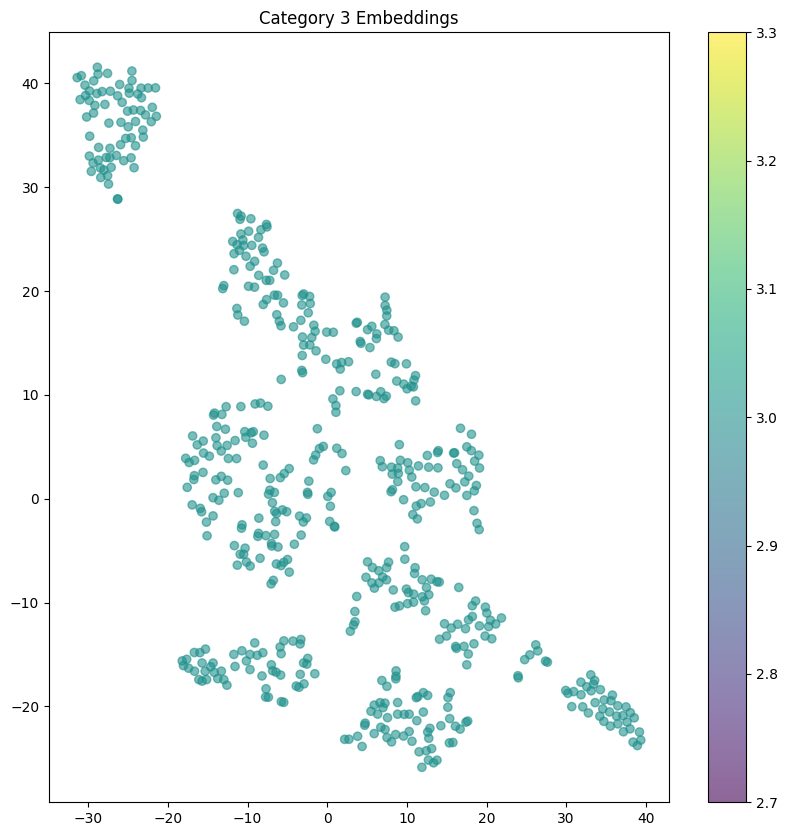

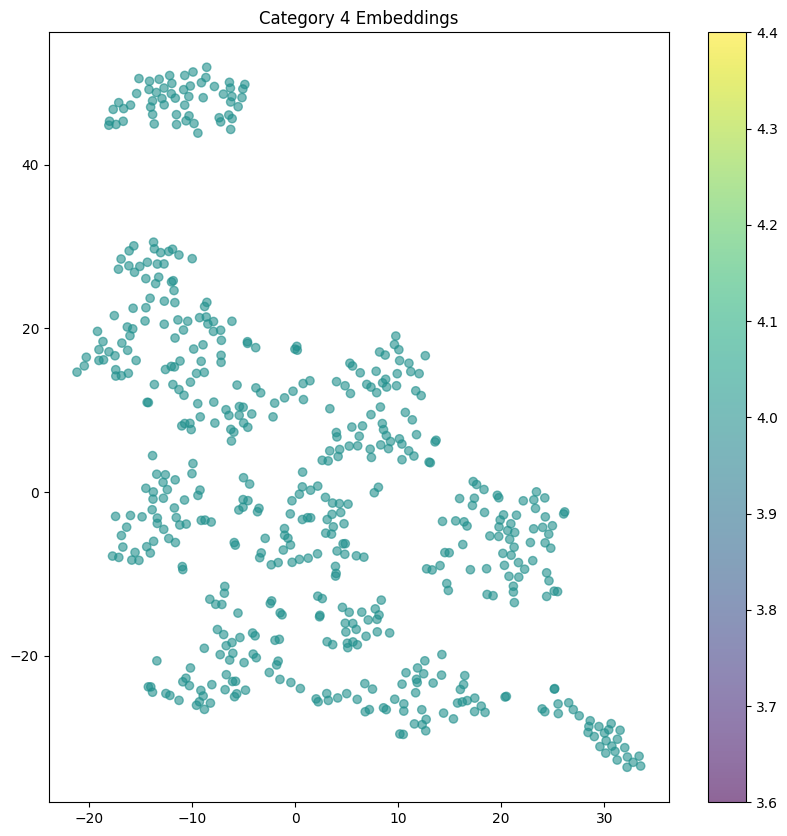

...

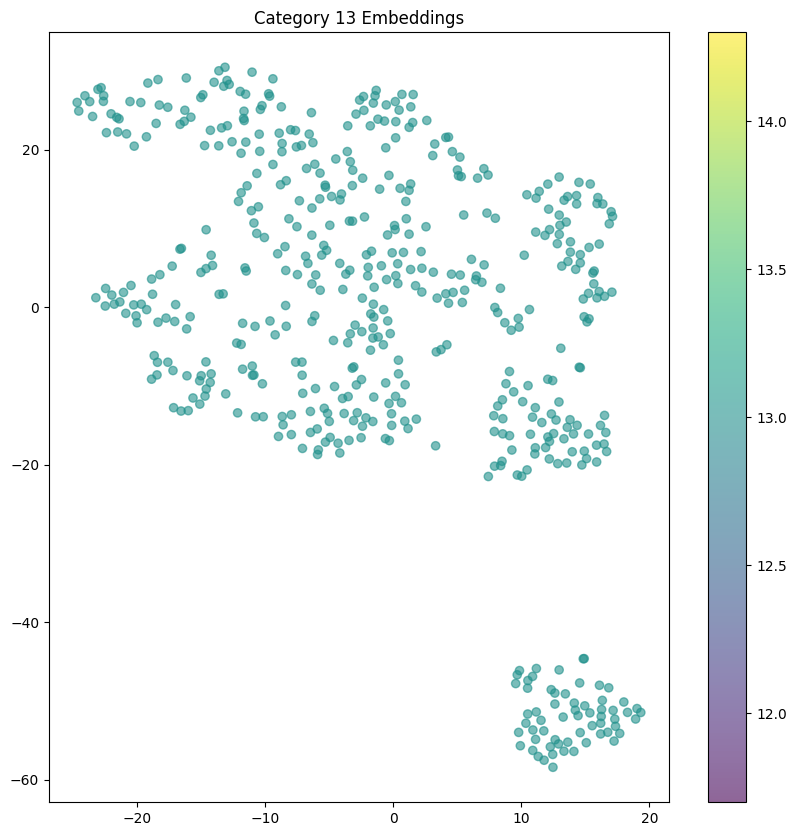

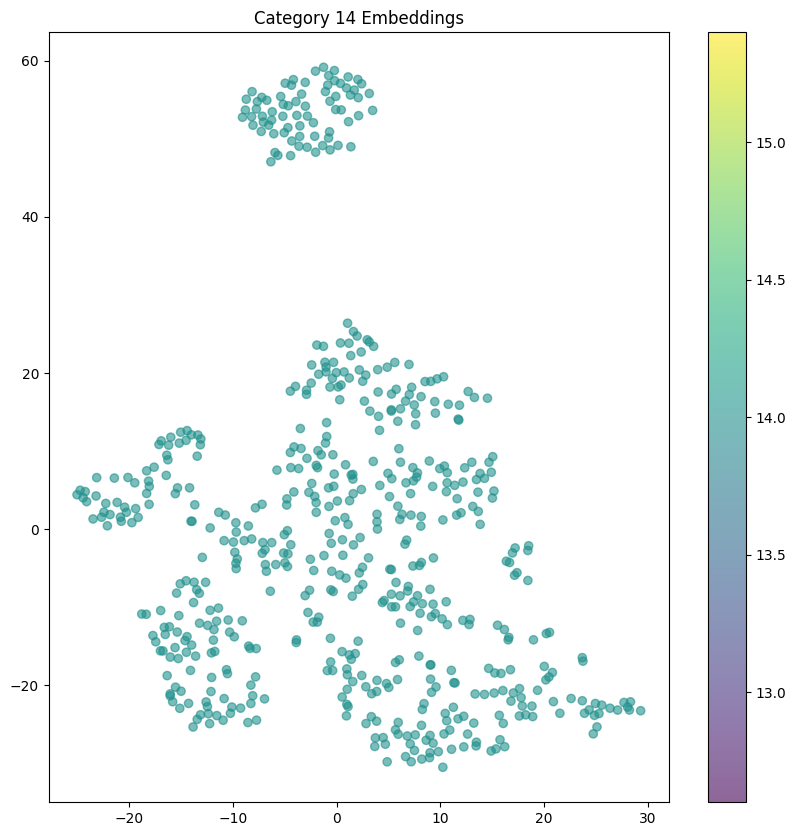

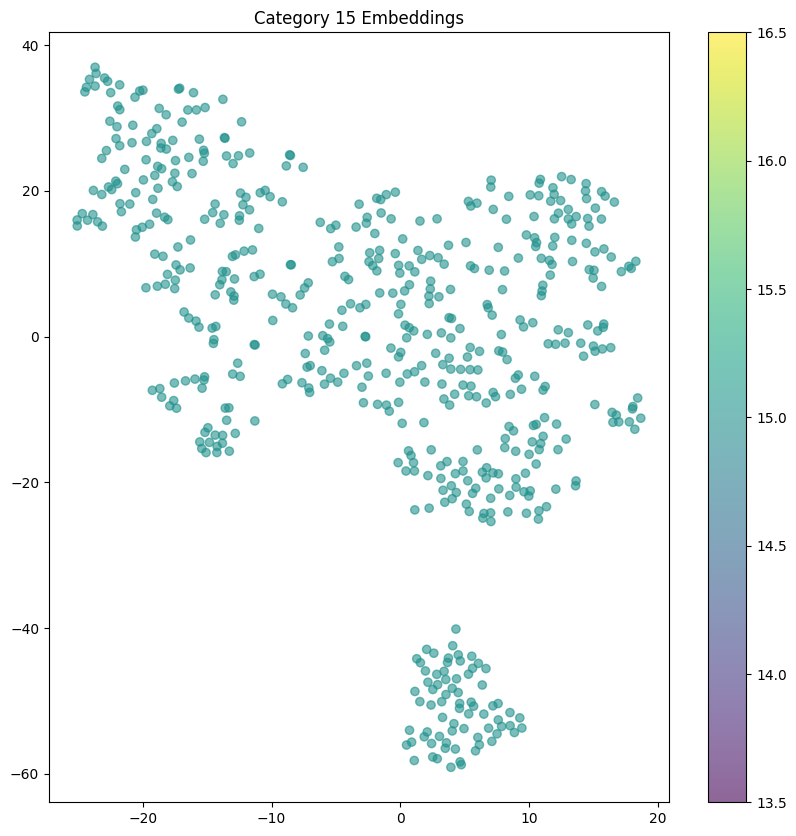

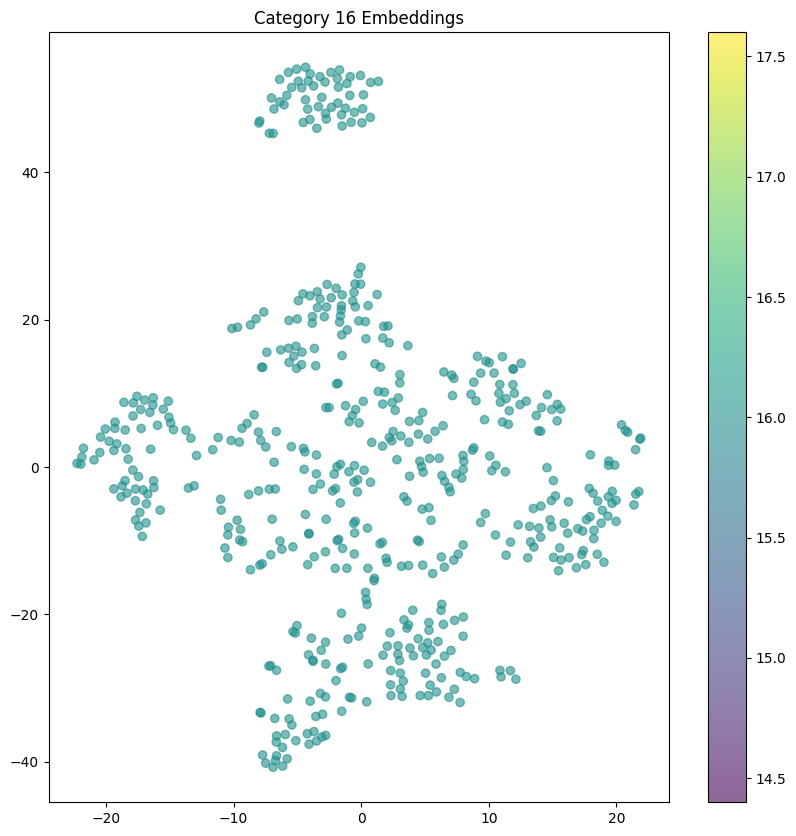

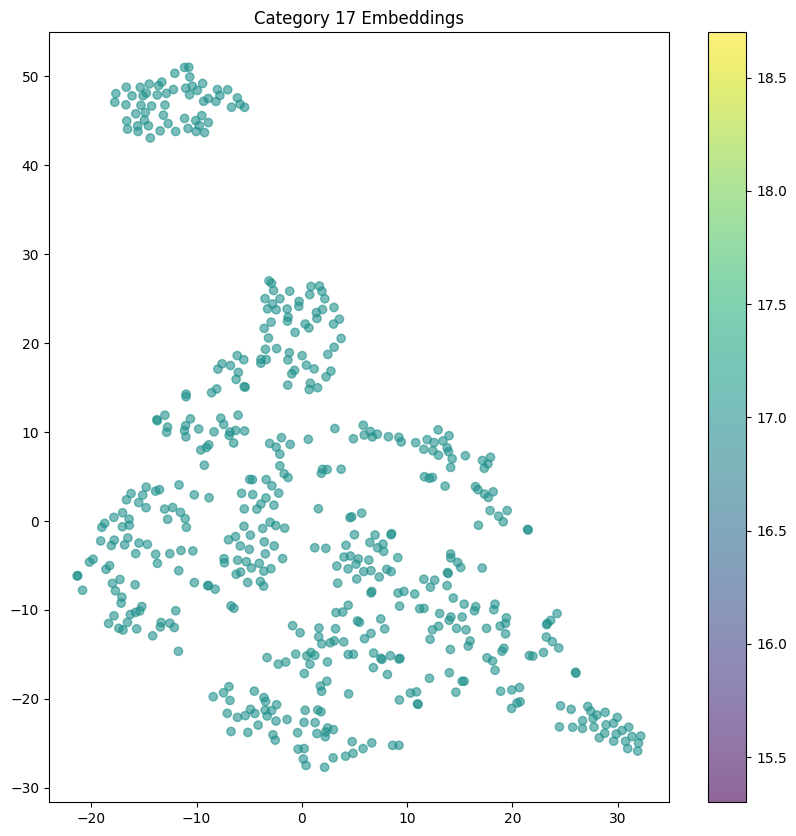

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

def plot_embeddings(embeddings, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title(title)
    plt.show()

for category, embeddings in category_dict.items():
    if embeddings.size > 0:
        plot_embeddings(embeddings, np.full(embeddings.shape[0], category), f'Category {category} Embeddings')


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

In [ ]:
normalized_embs = []
list_embs = []
for category, embeddings in category_dict.items():
  list_embs.append(embeddings)
  normalized_embs.append(scaler.fit_transform(embeddings))

In [ ]:
normalized_embs[0].shape

(553, 512)

In [ ]:
def plot_feature_cat(model, data, feature, results, step_angle):
    plt.figure(figsize=(12, 8))
    intervals = [f'{i*step_angle}-{(i+1)*step_angle}' for i in range(len(results))]
    plt.plot(intervals, results)
    plt.xlabel('Angles of rotation')
    plt.ylabel(f'{feature}')
    plt.title(f'{model} | {data} | {feature} for different categories of rotation')
    plt.show()

#### Persistence diagrams

In [ ]:
def get_vr_diagrams(normalized_embs, maxdim):
  vrs = []
  for i in range(len(normalized_embs)):
    vrs.append(drop_inf(vr_diagrams(normalized_embs[i], maxdim=maxdim)))
  return vrs

In [ ]:
vrs = get_vr_diagrams(normalized_embs, maxdim=1)
vrs

[[array([[ 0.       ,  2.457906 ],
         [ 0.       ,  2.6136224],
         [ 0.       ,  3.632719 ],
         ...,
         [ 0.       , 29.774769 ],
         [ 0.       , 30.084763 ],
         [ 0.       , 32.025833 ]], dtype=float32),
  array([[34.475773 , 35.0994   ],
         [29.94118  , 30.232304 ],
         [29.4456   , 29.54988  ],
         [28.64331  , 29.663412 ],
         [27.740974 , 29.719791 ],
         [27.704521 , 29.98847  ],
         [27.153732 , 27.677351 ],
         [25.583117 , 25.679611 ],
         [24.268393 , 25.358904 ],
         [24.207182 , 25.679611 ],
         [24.091145 , 24.181427 ],
         [23.868586 , 25.934584 ],
         [23.506855 , 25.838505 ],
         [23.113699 , 23.902388 ],
         [22.943228 , 25.453152 ],
         [22.857882 , 23.177233 ],
         [22.767729 , 25.06819  ],
         [22.728357 , 25.073742 ],
         [22.595892 , 25.934584 ],
         [22.544096 , 24.044626 ],
         [22.181376 , 22.637396 ],
         [21.937565 , 23

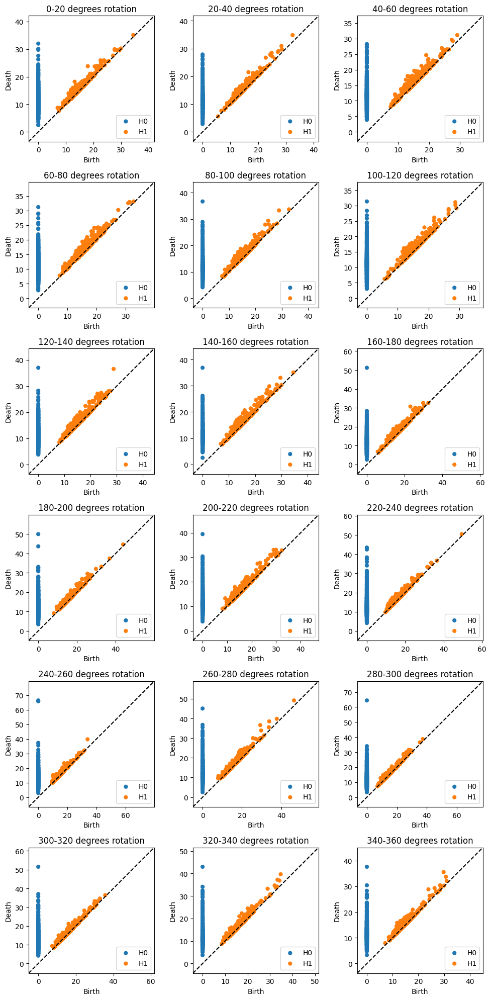

In [ ]:
num_diagrams = 18  # Number of diagrams to plot
fig, axes = plt.subplots(6, 3, figsize=(10, 20))  # 3 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs[i], labels=[f'H0', f'H1'], size=35, ax=ax)
    ax.set_title(f'{i*20}-{i*20+20} degrees rotation')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
vrs2 = get_vr_diagrams(normalized_embs, maxdim=2)

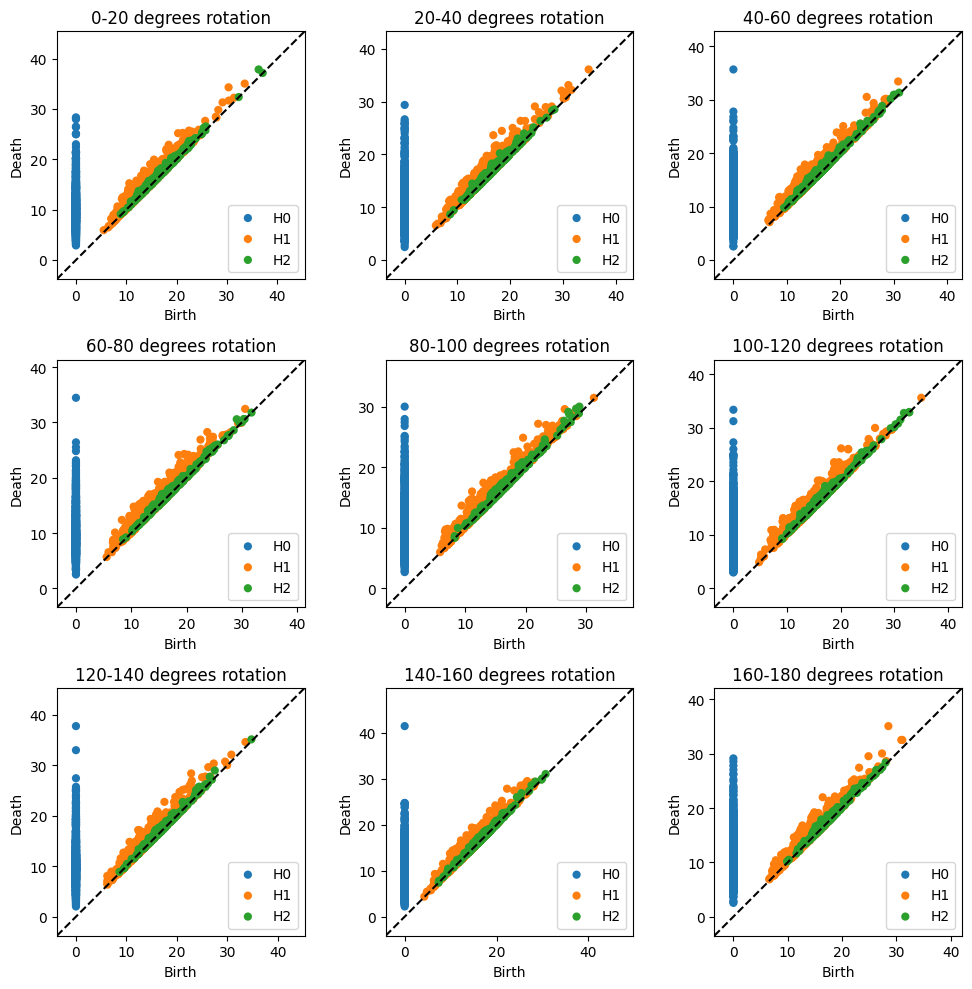

In [ ]:
num_diagrams = 9  # Number of diagrams to plot
fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs2[i], labels=['H0', 'H1', 'H2'], size=35, ax=ax)
    ax.set_title(f'{i*20}-{i*20+20} degrees rotation')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### Total persistence

In [ ]:
total_persistences = []
for num_emb in range(len(vrs)):
  total_persistences.append(total_persistence(vrs[num_emb], q=0.5))
  print(f'Angle: {num_emb*20}-{num_emb*20+20} | Total persistence: {total_persistences[num_emb]}')

Angle: 0-20 | Total persistence: 4299.126953125
Angle: 20-40 | Total persistence: 4303.3134765625
Angle: 40-60 | Total persistence: 4482.6162109375
Angle: 60-80 | Total persistence: 4245.6240234375
Angle: 80-100 | Total persistence: 4396.2041015625
Angle: 100-120 | Total persistence: 4085.94140625
Angle: 120-140 | Total persistence: 4351.8486328125
Angle: 140-160 | Total persistence: 4248.525390625
Angle: 160-180 | Total persistence: 3937.455810546875


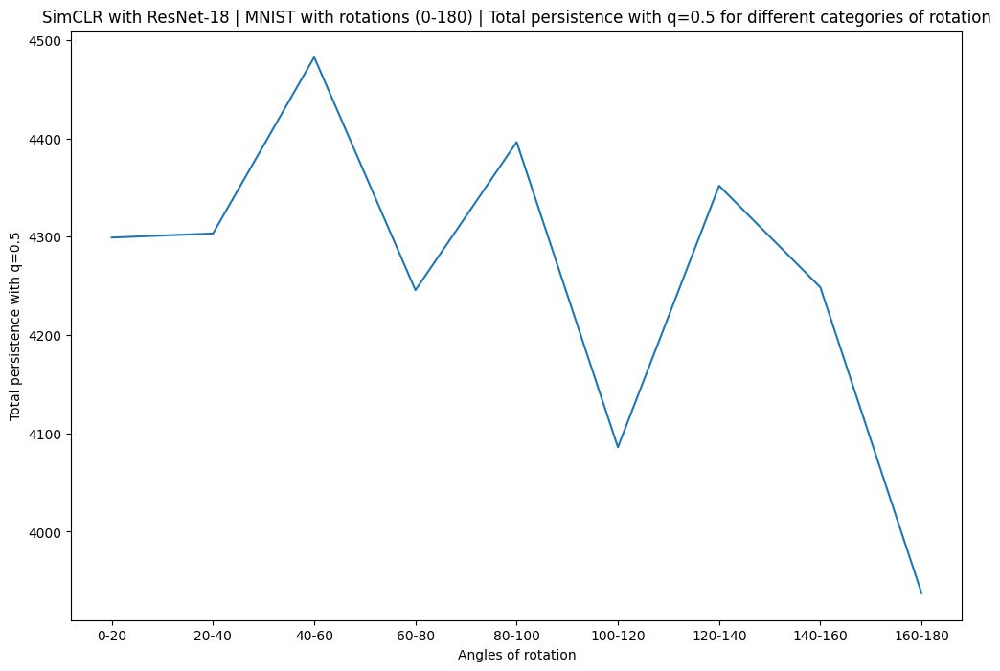

In [ ]:
plot_feature_cat(model="SimCLR with ResNet-18", data="MNIST with rotations (0-180)", feature='Total persistence with q=0.5', results=total_persistences, step_angle=20)

In [ ]:
total_persistences = []
for num_emb in range(len(vrs)):
  total_persistences.append(total_persistence(vrs[num_emb], q=1))
  print(f'Angle: {num_emb*20}-{num_emb*20+20} | Total persistence: {total_persistences[num_emb]}')

Angle: 0-20 | Total persistence: 12613.6171875
Angle: 20-40 | Total persistence: 12647.2197265625
Angle: 40-60 | Total persistence: 12970.50390625
Angle: 60-80 | Total persistence: 12372.5771484375
Angle: 80-100 | Total persistence: 12868.970703125
Angle: 100-120 | Total persistence: 11985.462890625
Angle: 120-140 | Total persistence: 12783.962890625
Angle: 140-160 | Total persistence: 12373.5107421875
Angle: 160-180 | Total persistence: 11848.3212890625


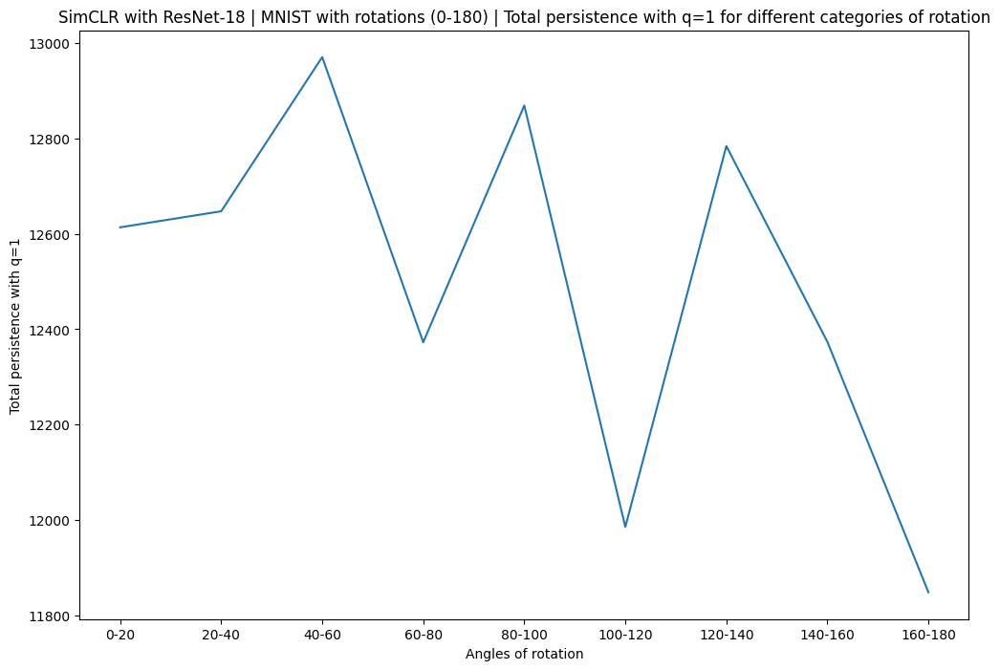

In [ ]:
plot_feature_cat(model="SimCLR with ResNet-18", data="MNIST with rotations (0-180)", feature='Total persistence with q=1', results=total_persistences, step_angle=20)

In [ ]:
total_persistence(vrs[-1], q=1)

11848.321

In [ ]:
persistence_norm(vrs[-1])

array([11108.70266724,   739.61831713])

#### Magnitudes

In [ ]:
reduced_embs = []

for embeddings in list_embs:
    reduced_embs.append(embeddings[:1000])

for i, reduced_embeddings in enumerate(reduced_embs):
    print(f"Category {i}, Reduced Embedding shape: {reduced_embeddings.shape}")

Category 0, Reduced Embedding shape: (1000, 512)
Category 1, Reduced Embedding shape: (1000, 512)
Category 2, Reduced Embedding shape: (1000, 512)
Category 3, Reduced Embedding shape: (1000, 512)
Category 4, Reduced Embedding shape: (1000, 512)
Category 5, Reduced Embedding shape: (1000, 512)
Category 6, Reduced Embedding shape: (1000, 512)
Category 7, Reduced Embedding shape: (1000, 512)
Category 8, Reduced Embedding shape: (1000, 512)


In [ ]:
magnitudes = []
for num_emb in range(len(reduced_embs)):
  magnitudes.append(magnitude(reduced_embs[num_emb]))

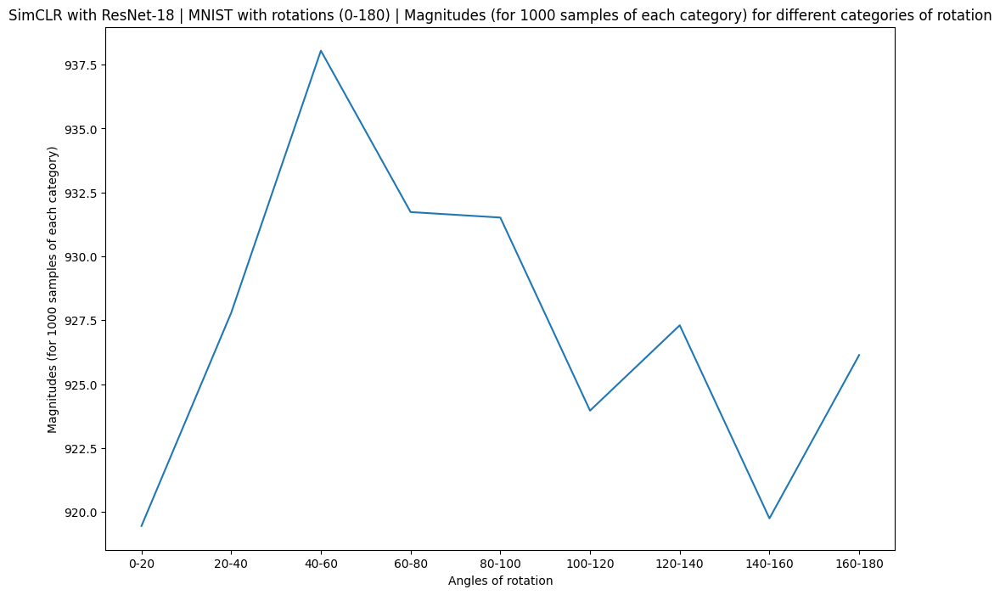

In [ ]:
plot_feature_cat(model="SimCLR with ResNet-18", data="MNIST with rotations (0-180)", feature='Magnitudes (for 1000 samples of each category)', results=magnitudes, step_angle=20)

### By classes (0-9)

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

mnist_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)
mnist_loader = DataLoader(mnist_dataset, batch_size=64, shuffle=False)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:10<00:00, 909291.15it/s] 


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 134372.16it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 957174.14it/s] 


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 4934091.89it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
loaded_model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_model.to(device)

all_embeddings = []
all_labels = []

with torch.no_grad():
    for images, labels in mnist_loader:
        images = images.to(device)
        _, features = loaded_model(images)
        all_embeddings.append(features.cpu().numpy())
        all_labels.append(labels.numpy())

all_embeddings = np.concatenate(all_embeddings, axis=0)
all_labels = np.concatenate(all_labels, axis=0)


In [ ]:
embeddings_by_class = {i: [] for i in range(10)}

for embedding, label in zip(all_embeddings, all_labels):
    embeddings_by_class[label].append(embedding)

for label in embeddings_by_class:
    embeddings_by_class[label] = np.array(embeddings_by_class[label])


In [ ]:
embeddings_by_class[1].shape

(1135, 512)

In [ ]:
reduced_embeddings_by_class = {label: [] for label in range(10)}

for label, embeddings in embeddings_by_class.items():
    reduced_embeddings_by_class[label] = embeddings[:100, :]

In [ ]:
reduced_embeddings_by_class[1].shape

(100, 512)

#### Magnitudes

In [ ]:
magnitudes_by_class = {}

for label, embeddings in reduced_embeddings_by_class.items():
    magnitudes_by_class[label] = magnitude(embeddings)

In [ ]:
magnitudes_by_class

{0: 99.36809555565928,
 1: 92.53915159911992,
 2: 99.91396784084075,
 3: 99.90200400020795,
 4: 99.57749364917423,
 5: 99.6097899234976,
 6: 99.90102244273288,
 7: 99.73883344702097,
 8: 99.8126537747952,
 9: 99.62824489297913}

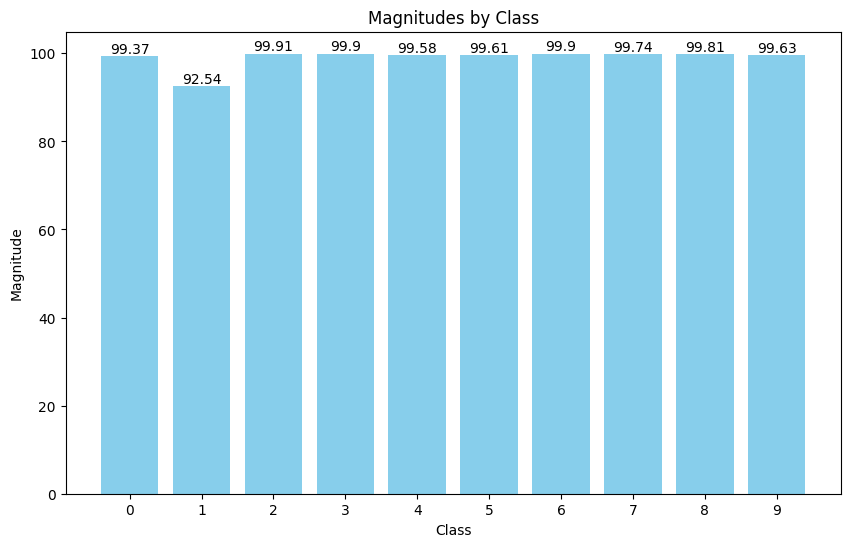

In [ ]:
# Extract class labels and magnitudes
classes = list(magnitudes_by_class.keys())
magnitudes = list(magnitudes_by_class.values())

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(classes, magnitudes, color='skyblue')

# Add labels and title
plt.xlabel('Class')
plt.ylabel('Magnitude')
plt.title('Magnitudes by Class')
plt.xticks(classes)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Show plot
plt.show()

#### Persistence diagrams

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

In [ ]:
reduced_embeddings_by_class = {label: [] for label in range(10)}

for label, embeddings in embeddings_by_class.items():
    reduced_embeddings_by_class[label] = embeddings[:500, :]

In [ ]:
normalized_embs = []
list_embs = []
for category, embeddings in reduced_embeddings_by_class.items():
  list_embs.append(embeddings)
  normalized_embs.append(scaler.fit_transform(embeddings))

In [ ]:
vrs2 = []
for i in range(len(normalized_embs)):
  vrs2.append(drop_inf(vr_diagrams(normalized_embs[i], maxdim=2)))

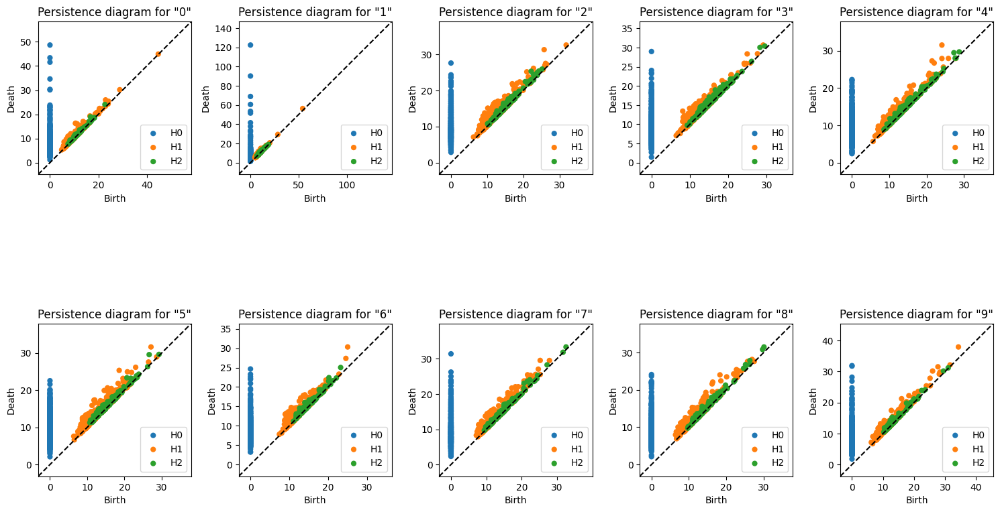

In [ ]:
num_diagrams = 10  # Number of diagrams to plot
fig, axes = plt.subplots(2, 5, figsize=(15, 10))  # 2 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each persistence diagram in a subplot
for i in range(num_diagrams):
    ax = axes[i]
    persim.plot_diagrams(vrs2[i], labels=[f'H0', f'H1', f'H2'], size=35, ax=ax)
    ax.set_title(f'Persistence diagram for "{i}"')

# Hide any empty subplots (if fewer than 6 diagrams)
for j in range(num_diagrams, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### Total persistence

In [ ]:
vrs = []
for i in range(len(normalized_embs)):
  vrs.append(drop_inf(vr_diagrams(normalized_embs[i], maxdim=1)))

In [ ]:
total_persistences = []
for num_emb in range(len(vrs)):
  total_persistences.append(total_persistence(vrs[num_emb], q=0.5))
  print(f'Digit: {num_emb} | Total persistence: {total_persistences[num_emb]}')

Digit: 0 | Total persistence: 1595.9931640625
Digit: 1 | Total persistence: 1527.2103271484375
Digit: 2 | Total persistence: 1909.2769775390625
Digit: 3 | Total persistence: 1863.604736328125
Digit: 4 | Total persistence: 1825.79638671875
Digit: 5 | Total persistence: 1900.9619140625
Digit: 6 | Total persistence: 1859.22314453125
Digit: 7 | Total persistence: 1852.395263671875
Digit: 8 | Total persistence: 1816.26904296875
Digit: 9 | Total persistence: 1780.3546142578125


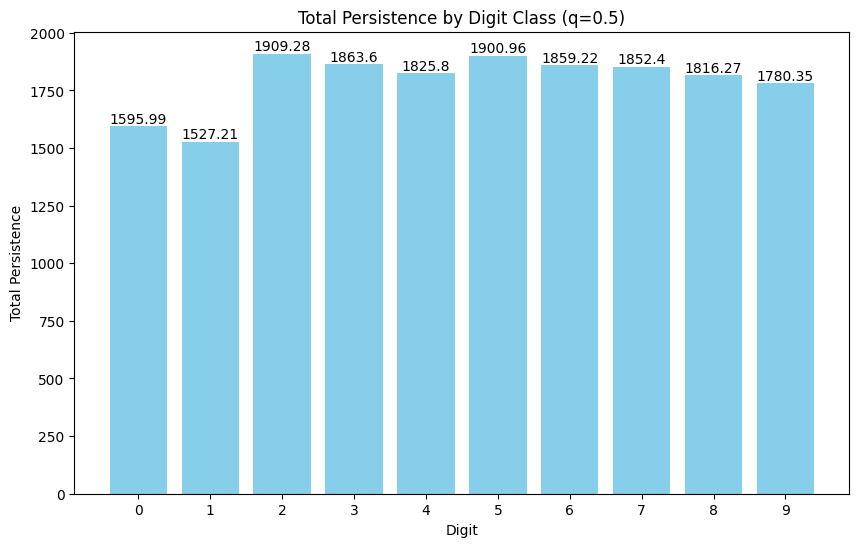

In [ ]:

# Generate digit labels (0-9) based on the length of total_persistences
digit_labels = list(range(len(total_persistences)))

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(digit_labels, total_persistences, color='skyblue')

# Add labels and title
plt.xlabel('Digit')
plt.ylabel('Total Persistence')
plt.title('Total Persistence by Digit Class (q=0.5)')
plt.xticks(digit_labels)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Show plot
plt.show()

In [ ]:
total_persistences = []
for num_emb in range(len(vrs)):
  total_persistences.append(total_persistence(vrs[num_emb], q=1))
  print(f'Angle: {num_emb*20}-{num_emb*20+20} | Total persistence: {total_persistences[num_emb]}')

Angle: 0-20 | Total persistence: 4126.33349609375
Angle: 20-40 | Total persistence: 4036.34716796875
Angle: 40-60 | Total persistence: 5306.78955078125
Angle: 60-80 | Total persistence: 5143.18359375
Angle: 80-100 | Total persistence: 4909.07568359375
Angle: 100-120 | Total persistence: 5244.88671875
Angle: 120-140 | Total persistence: 4984.51611328125
Angle: 140-160 | Total persistence: 5181.3076171875
Angle: 160-180 | Total persistence: 4994.6552734375
Angle: 180-200 | Total persistence: 4804.310546875


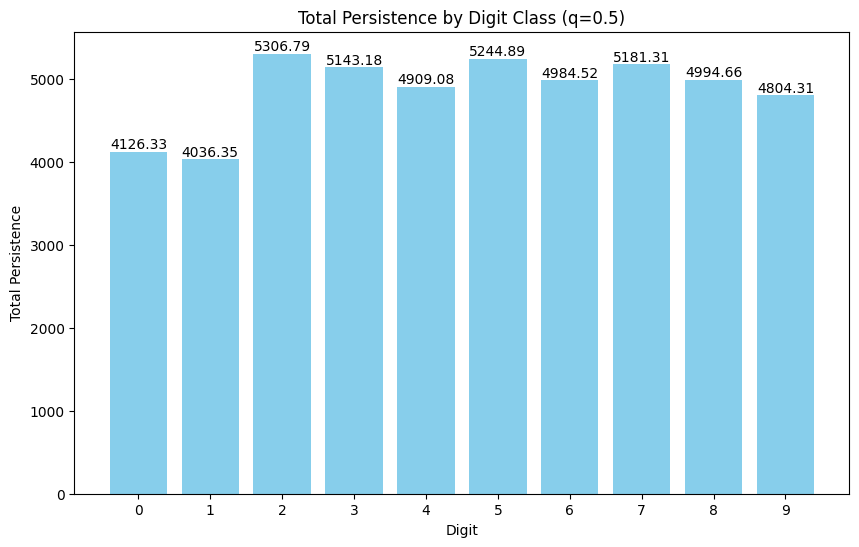

In [ ]:

# Generate digit labels (0-9) based on the length of total_persistences
digit_labels = list(range(len(total_persistences)))

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(digit_labels, total_persistences, color='skyblue')

# Add labels and title
plt.xlabel('Digit')
plt.ylabel('Total Persistence')
plt.title('Total Persistence by Digit Class (q=0.5)')
plt.xticks(digit_labels)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Show plot
plt.show()

#### ID

In [ ]:
id_two_nn, id_mle = id_experiment(normalized_embs)

In [ ]:
id_two_nn, id_mle


([4.614005481941579,
  4.929386257587059,
  5.265413697852774,
  4.659333143646916,
  4.808553531825209,
  5.271462703949274,
  5.514745925296036,
  4.910601787245103,
  5.240183744879065,
  4.76701085727811],
 [5.106362687316246,
  5.832127700872676,
  5.625657832374689,
  5.963192436980328,
  5.693712285726376,
  5.818450801227433,
  5.48273756977375,
  5.671149175259978,
  5.78056006579988,
  5.439158090011781])

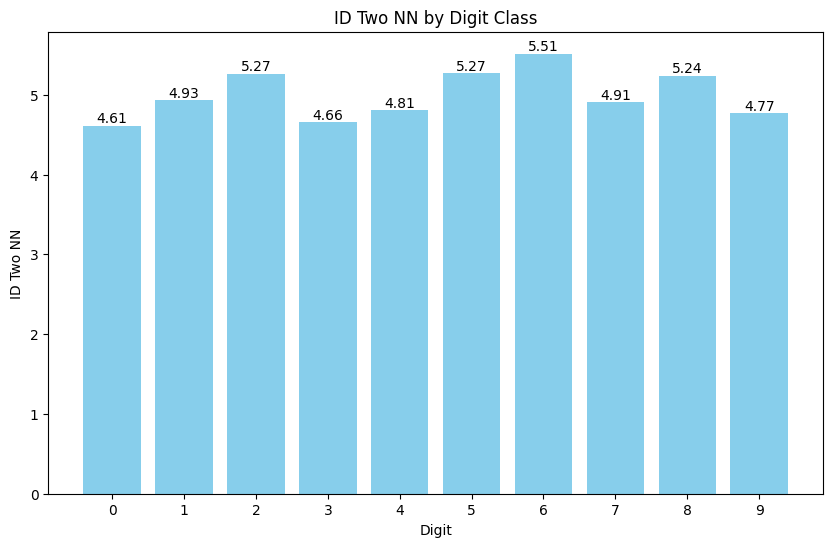

In [ ]:
# Generate digit labels (0-9) based on the length of id_two_nn
digit_labels = list(range(len(id_two_nn)))

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(digit_labels, id_two_nn, color='skyblue')

# Add labels and title
plt.xlabel('Digit')
plt.ylabel('ID Two NN')
plt.title('ID Two NN by Digit Class')
plt.xticks(digit_labels)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Show plot
plt.show()

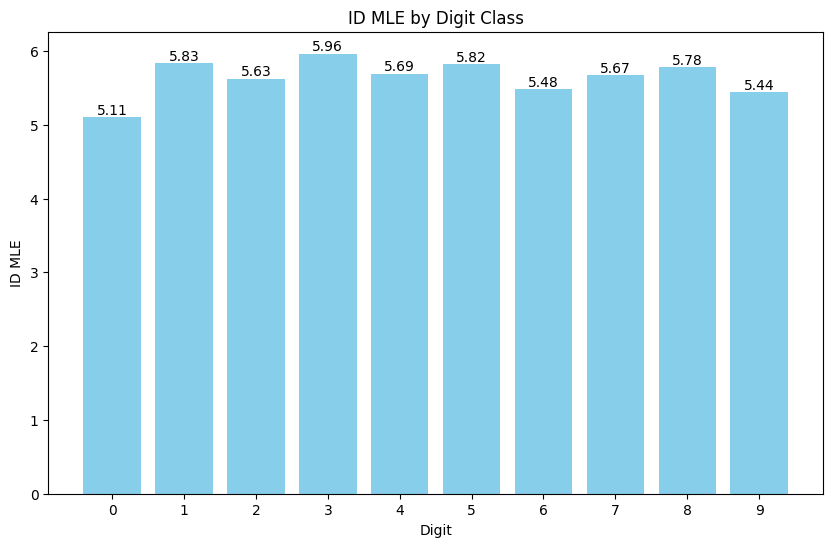

In [ ]:
digit_labels = list(range(len(id_mle)))

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(digit_labels, id_mle, color='skyblue')

# Add labels and title
plt.xlabel('Digit')
plt.ylabel('ID MLE')
plt.title('ID MLE by Digit Class')
plt.xticks(digit_labels)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Show plot
plt.show()

In [ ]:
rtd(normalized_embs[0], normalized_embs[1])

array([   0.        , 1942.17731261])

In [ ]:
rtd(normalized_embs[6], normalized_embs[9])

array([   0.       , 2114.2542789])

In [ ]:
rtd(normalized_embs[1], normalized_embs[9])

array([   0.        , 1696.31856227])

In [ ]:
rtd(normalized_embs[1], normalized_embs[7])

array([   0.        , 1602.73283172])

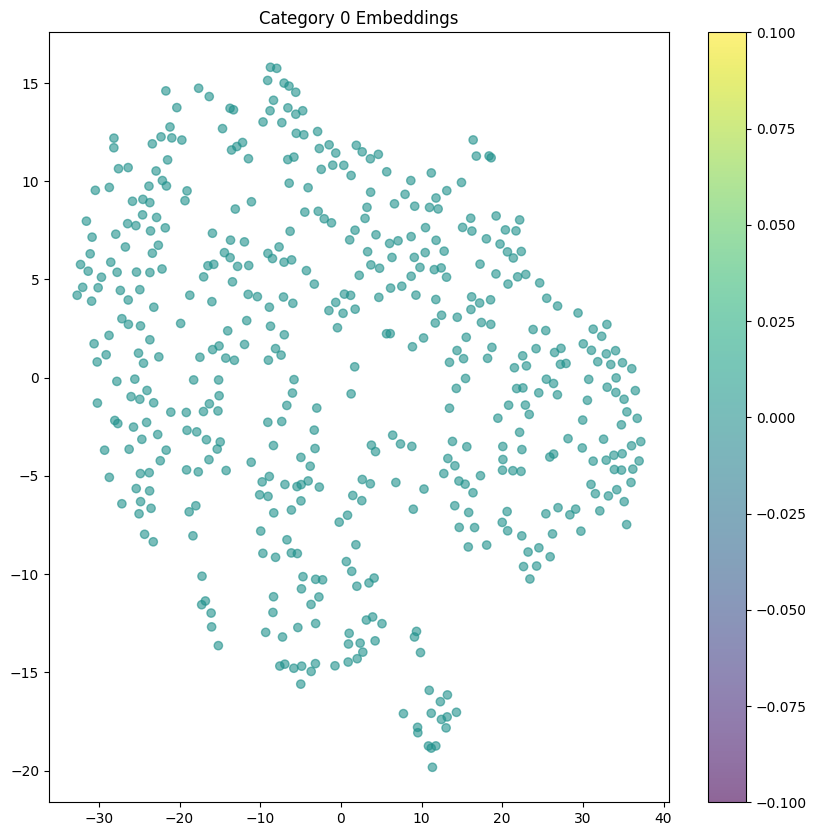

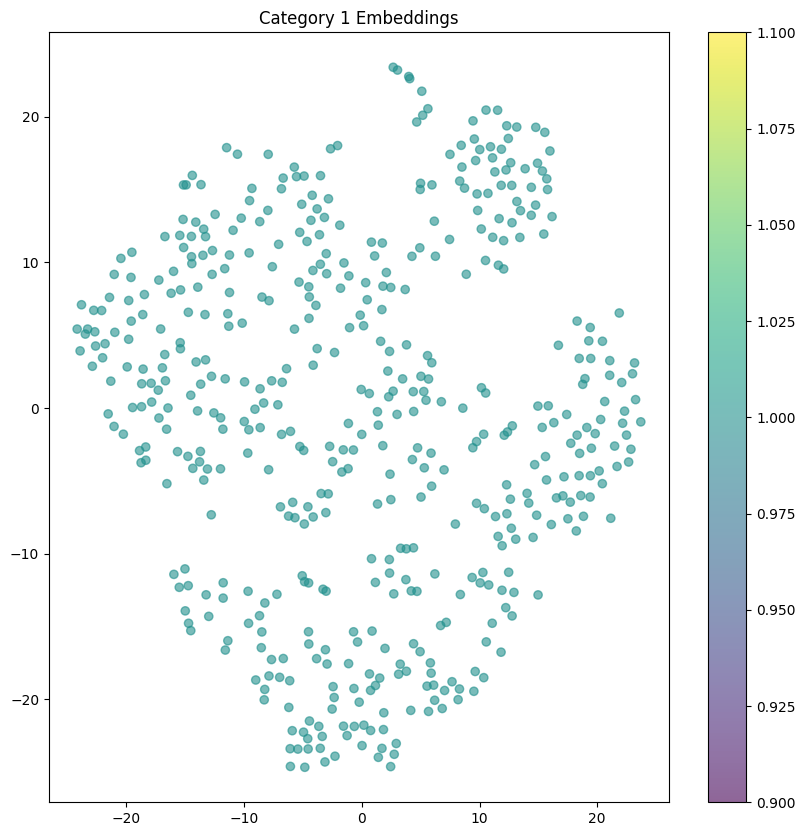

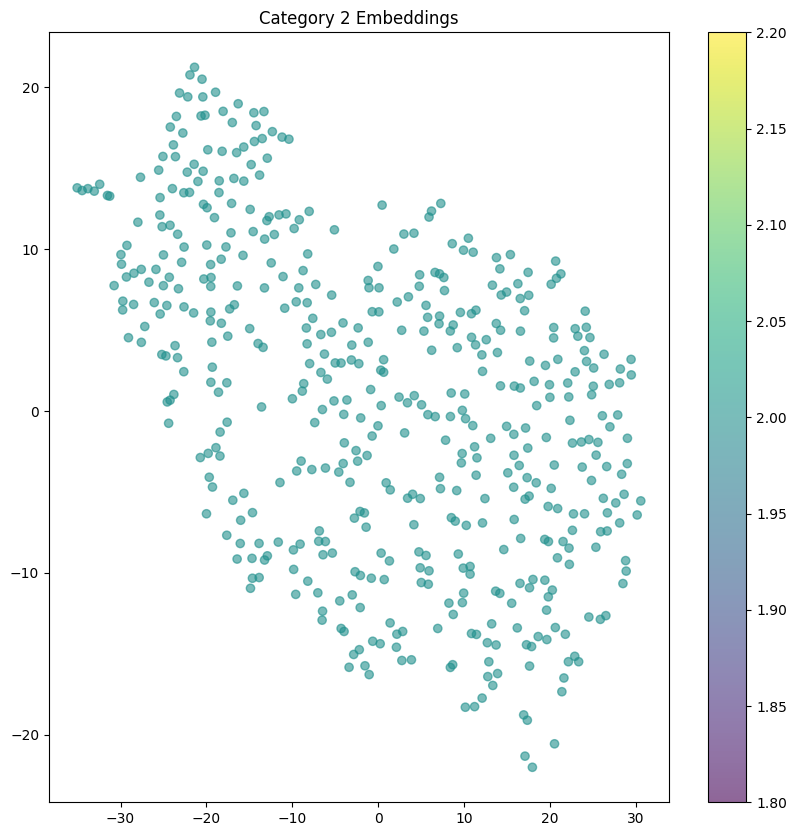

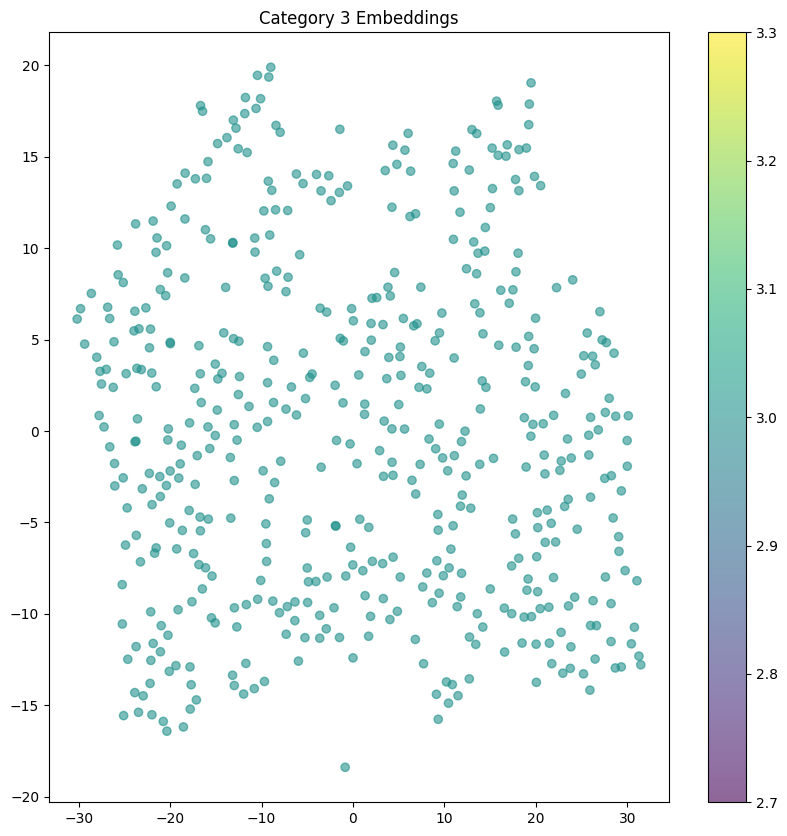

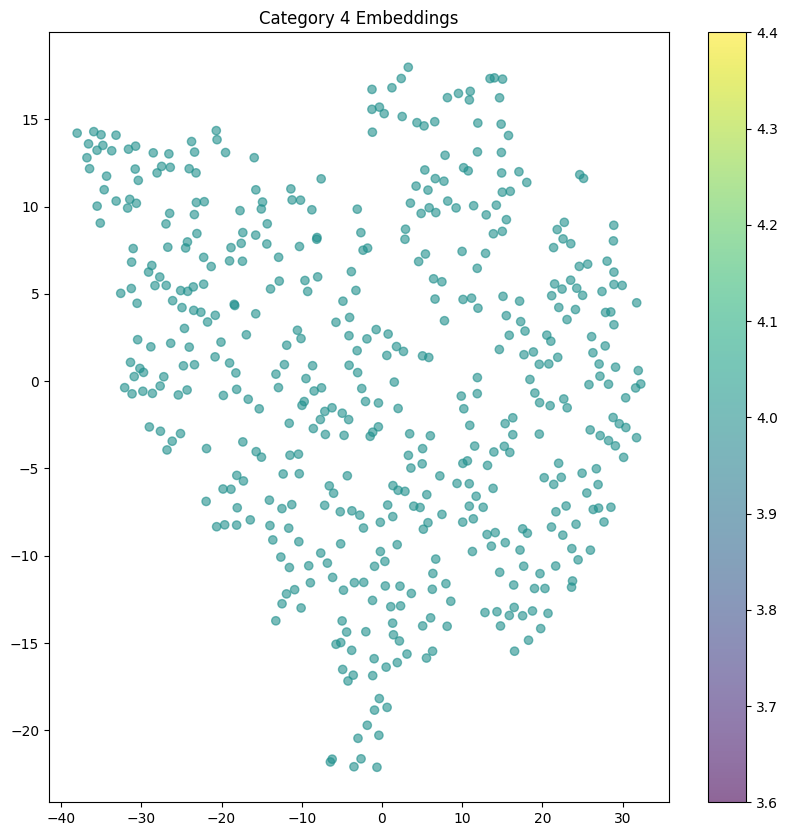

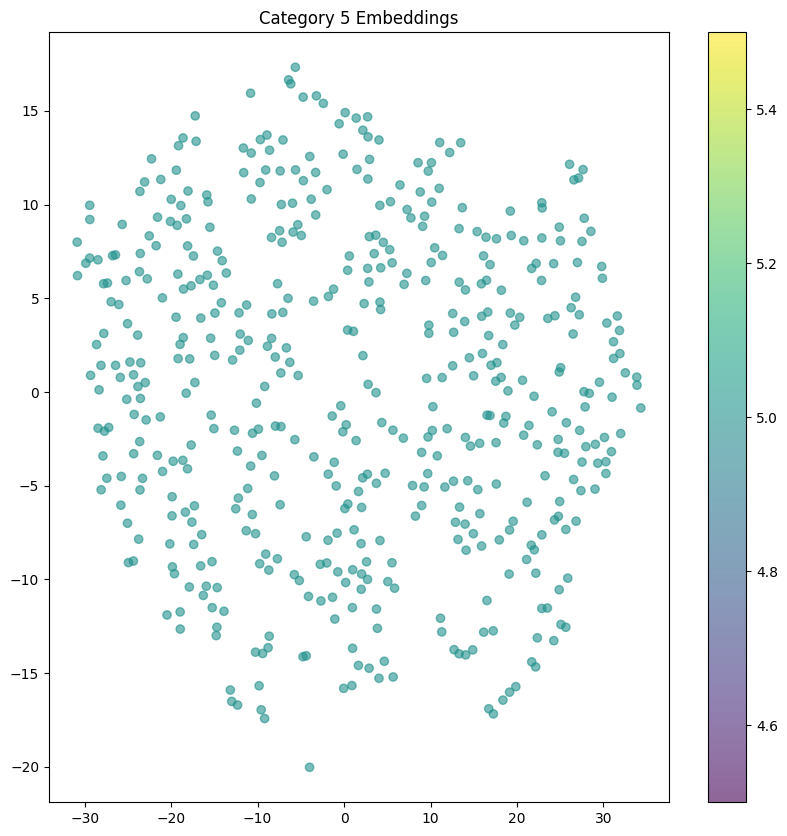

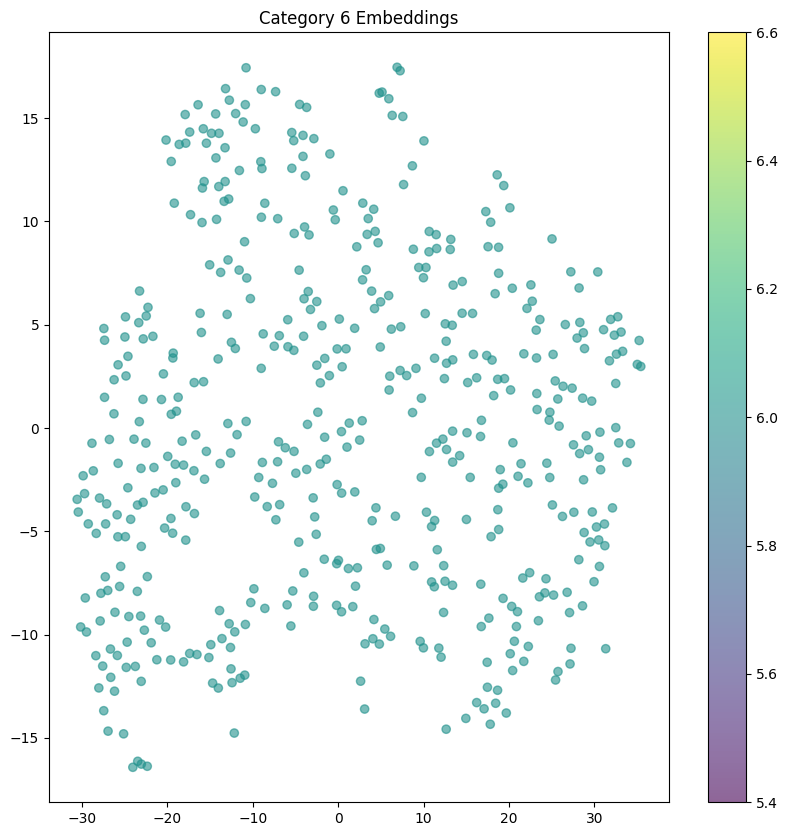

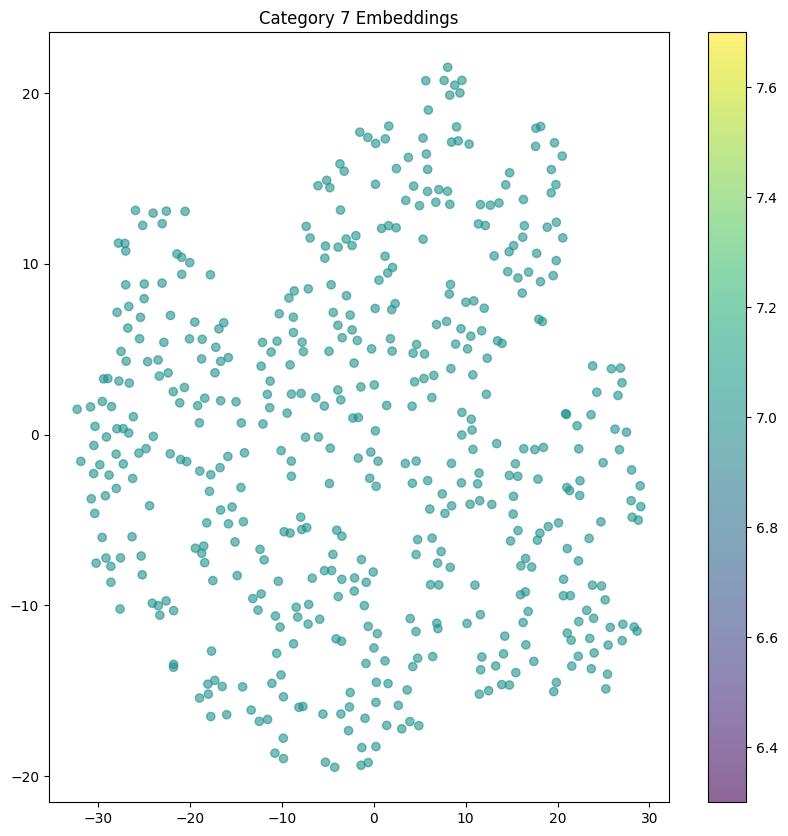

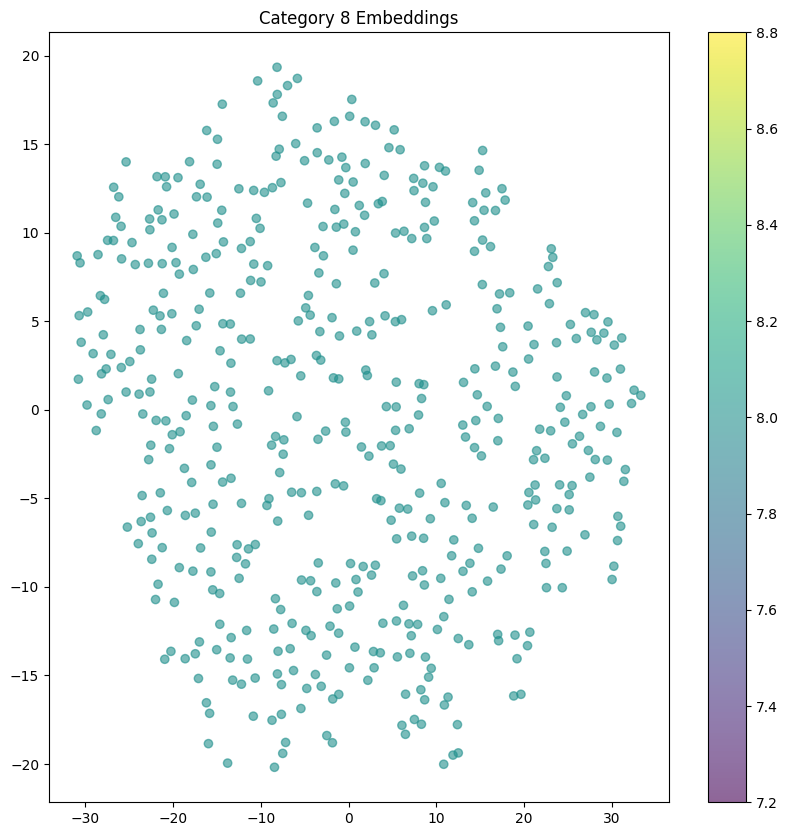

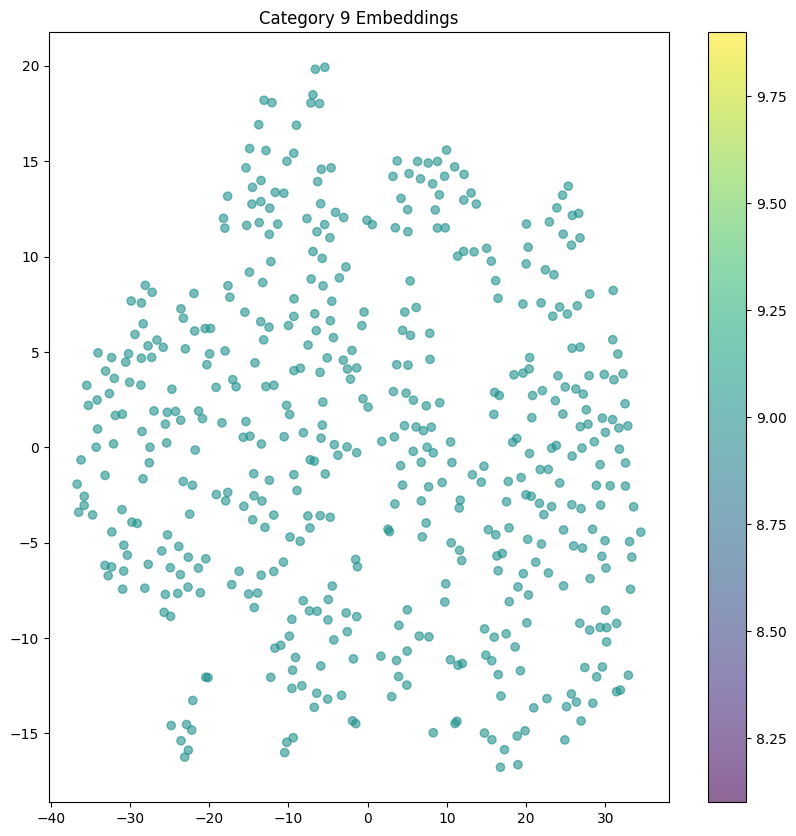

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

def plot_embeddings(embeddings, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title(title)
    plt.show()

for category, embeddings in reduced_embeddings_by_class.items():
    if embeddings.size > 0:
        plot_embeddings(embeddings, np.full(embeddings.shape[0], category), f'Category {category} Embeddings')
